# Final Project

In [2]:
from ultralytics import YOLO
import glob
from pathlib import Path

import pandas as pd
import os, cv2, re
import numpy as np
import xml.etree.ElementTree as ET

# Data visualization

Los datos han sido descargados de https://universe.roboflow.com/rjacaac1/ua-detrac-dataset-10k/dataset/2

Estos son archivos txt los cuales estos son los nombres de las columnas en el mismo orden en el que lo encontramos en los archivos

[class_id, center_x, center_y, width, height]

Ahora vamos a visualizar las imagenes que estan en formato jpg. 

- UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images/
- UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/

# Data Preprocessing

In [4]:
# Define la ruta raíz donde estás ahora (el punto '.' significa carpeta actual)
# Si ejecutas el script desde fuera, cambia '.' por la ruta completa
dataset_path = './UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8' 

# Listas para almacenar la información
data = []

# Las carpetas que suele tener YOLOv8 (a veces 'test' no existe, por eso lo comprobaremos)
# splits = ['train', 'valid', 'test']
splits = ['train', 'valid'] # NO EXISTE TEST EN NUESTRA DESCARGA 

for split in splits:
    # Construimos la ruta: ./train/images/*.jpg
    search_path = os.path.join(dataset_path, split, 'images', '*.jpg')
    images = glob.glob(search_path)
    
    # Si la carpeta no existe o está vacía (ej. test), pasamos a la siguiente
    if not images:
        continue

    print(f"Procesando {split}: {len(images)} imágenes encontradas.")

    for img_path in images:
        # 1. Obtener ID de la imagen (nombre del archivo sin extensión)
        filename = os.path.basename(img_path)
        image_id = os.path.splitext(filename)[0]
        
        # 2. Construir la ruta de la etiqueta correspondiente
        # La lógica de YOLO es cambiar /images/ por /labels/ y .jpg por .txt
        label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
        
        # Opcional: Verificar si el txt existe (para evitar errores luego)
        # if not os.path.exists(label_path):
        #     label_path = None # O marcar como 'missing'
            
        data.append({
            'image_id': image_id,
            'image_path': img_path,   # Ruta de la imagen
            'label_path': label_path, # Ruta del txt
            'set': split            # 'train', 'valid' o 'test'
        })

# Crear el DataFrame
df = pd.DataFrame(data)

# Muestra las primeras filas
print("\n--- Primeras 5 filas del DataFrame ---")
print(df.head())

# Muestra el conteo por set para verificar
print("\n--- Resumen del Dataset ---")
print(df['set'].value_counts())

Procesando train: 9316 imágenes encontradas.
Procesando valid: 500 imágenes encontradas.

--- Primeras 5 filas del DataFrame ---
                                            image_id  \
0  MVI_20052_img00158_jpg.rf.50ed1502ff234681b511...   
1  MVI_39271_img00494_jpg.rf.1184116be16d110fb166...   
2  MVI_39361_img01720_jpg.rf.c1a0eb49147326a4b1bc...   
3  MVI_39401_img00559_jpg.rf.73be5b65ab57747a13c3...   
4  MVI_39771_img00025_jpg.rf.cc566f41b407cf2eb0ba...   

                                          image_path  \
0  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...   
1  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...   
2  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...   
3  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...   
4  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...   

                                          label_path    set  
0  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...  train  
1  ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.y...  train  
2  ./UA-DET

In [5]:
df.columns

Index(['image_id', 'image_path', 'label_path', 'set'], dtype='object')

# Training of the model 

In [36]:
class_names = {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}

# 🛠️ Data Preparation: Class-Aware Stratified K-Fold

### The Challenge
The UA-DETRAC dataset is **highly unbalanced**. 
- **Cars** are extremely common (>90% of detections).
- **Buses and Trucks** are rare.

If we use a standard random split, we risk creating a validation fold that has **zero buses**, making it impossible to evaluate the model's performance on rare classes. Furthermore, since this is **video data**, random shuffling can cause "Data Leakage" (Frame 100 in Train, Frame 101 in Val), leading to fake high scores.

### The Solution
We implement a custom **Priority-Based Stratified Split**:
1.  **Rarity Ranking:** We scan every image label. If an image contains a **Bus**, it gets "Priority 0" (Highest). If it only contains Cars, it gets "Priority 2" (Lowest).
2.  **Stratified Split:** We ensure every fold gets an equal distribution of these Priority groups.
3.  **No Shuffle:** We keep `shuffle=False` to preserve video sequences and prevent time-based data leakage.

In [5]:
import os
import glob
import yaml

# --- CONFIG ---
dataset_path = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8"
output_dir = 'folds_no_shuffle'
os.makedirs(output_dir, exist_ok=True)
class_names = {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}

# 1. Get ALL images and sort them so sequences (MVI_...) stay together
all_images = sorted(glob.glob(os.path.join(dataset_path, "train/images/*.jpg")))
num_images = len(all_images)
fold_size = num_images // 5

print(f"Total images found: {num_images}")

for k in range(5):
    # Determine the Validation Block
    val_start = k * fold_size
    val_end = (k + 1) * fold_size
    
    val_files = all_images[val_start:val_end]
    val_set = set(val_files)
    train_files = [x for x in all_images if x not in val_set]
    
    # Define paths
    val_txt_path = os.path.abspath(os.path.join(output_dir, f'val_fold_{k}.txt'))
    train_txt_path = os.path.abspath(os.path.join(output_dir, f'train_fold_{k}.txt'))
    yaml_file_path = os.path.join(output_dir, f'fold_{k}.yaml')

    # Save the .txt lists (YOLO needs these for absolute pathing)
    with open(val_txt_path, 'w') as f:
        f.write('\n'.join([os.path.abspath(x) for x in val_files]))
    with open(train_txt_path, 'w') as f:
        f.write('\n'.join([os.path.abspath(x) for x in train_files]))

    # Create the YAML
    yaml_data = {
        'path': os.path.abspath(dataset_path),
        'train': train_txt_path, # Points to the 8,000 image list
        'val': val_txt_path,     # Points to the 2,000 image list
        'names': class_names
    }
    
    with open(yaml_file_path, 'w') as f:
        yaml.dump(yaml_data, f, default_flow_style=False)

    print(f"✅ Fold {k}: Train={len(train_files)} images | Val={len(val_files)} images")

print(f"\n🚀 FOLDS FIXED. Every fold now has ~8,000 images.")

Total images found: 9316
✅ Fold 0: Train=7453 images | Val=1863 images
✅ Fold 1: Train=7453 images | Val=1863 images
✅ Fold 2: Train=7453 images | Val=1863 images
✅ Fold 3: Train=7453 images | Val=1863 images
✅ Fold 4: Train=7453 images | Val=1863 images

🚀 FOLDS FIXED. Every fold now has ~8,000 images.


In [6]:
# Rarity-based priority: 
# 0 = Bus (Gold - Rare)
# 1 = Truck/Van (Silver - Medium)
# 2 = Car (Bronze - Common)
priority_map = {
    0: 0,  # Bus
    2: 1,  # Truck (Wait, check your dataset class IDs!)
    3: 1,  # Van
    1: 2   # Car
}

In [7]:
# ==========================================
#        2. FIND IMAGES (TRAIN ONLY)
# ==========================================

print(f"--- SEARCHING FOR IMAGES ---")

# Point directly to train/images to avoid validation leakage
train_imgs_dir = os.path.join(dataset_path, "train/images")
images = sorted(glob.glob(os.path.join(train_imgs_dir, '*.jpg')))

# Recursive fallback if needed
if len(images) == 0:
    print("Standard path empty. Searching recursively...")
    images = sorted(glob.glob(os.path.join(train_imgs_dir, '**', '*.jpg'), recursive=True))

print(f"Images Found: {len(images)}")

# --- SAFETY CHECK ---
# UA-DETRAC Train should be around ~9200-9400 images. 
# If >10k, you likely accidentally included the original validation set.
if len(images) > 9500:
    raise ValueError(f"❌ STOP: Found {len(images)} images. This looks like Train+Val combined. Check paths!")
elif len(images) == 0:
    raise ValueError("❌ ERROR: No images found. Check your BASE_PROJECT_DIR.")
else:
    print("✅ SAFETY CHECK PASSED: Image count looks correct for a clean Training set.")

--- SEARCHING FOR IMAGES ---
Images Found: 9316
✅ SAFETY CHECK PASSED: Image count looks correct for a clean Training set.


In [8]:
# ==========================================
#        3. CALCULATE PRIORITY TAGS
# ==========================================

data = []
print("Scanning labels to assign priority groups...")

for img_path in images:
    # Logic to find the corresponding label
    label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
    assigned_priority = 99 
    
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
        
        if lines:
            # Extract classes found in this image
            try:
                classes_in_img = set([int(line.split()[0]) for line in lines])
            except:
                classes_in_img = set()
            
            # Find the "rarest" class in this image
            best_prio = 99
            for c in classes_in_img:
                p = priority_map.get(c, 10) 
                if p < best_prio:
                    best_prio = p
            assigned_priority = best_prio
    
    # Store result
    data.append({
        'path': os.path.abspath(img_path), 
        'priority_group': assigned_priority
    })

# Create DataFrame
df = pd.DataFrame(data)

print("\n--- Class Priority Distribution ---")
# This shows how many images belong to each "Rarity Tier"
print(df['priority_group'].value_counts().sort_index())

Scanning labels to assign priority groups...

--- Class Priority Distribution ---
priority_group
0    1350
1    5063
2    2903
Name: count, dtype: int64


### 📊 Understanding the Priority Distribution
The table above shows how many images fall into each "Rarity Tier":
* **Group 0 (Gold):** Images containing at least one **Bus**. These are the most valuable images to distribute evenly.
* **Group 1 (Silver):** Images containing **Trucks or Vans** (but no Buses).
* **Group 2 (Bronze):** Images containing **only Cars**.

We will now feed these groups into `StratifiedKFold`. This forces the algorithm to respect these ratios, ensuring that Fold 1 doesn't hoard all the Buses while Fold 5 gets none.

In [9]:
import os
import yaml
import pandas as pd
from sklearn.model_selection import StratifiedKFold

# 1. SETUP
# shuffle=True allows randomization but keeps priority ratios identical per fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

output_dir = 'folds_stratified_shuffled'
os.makedirs(output_dir, exist_ok=True)
dataset_path = os.path.abspath("UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8")

# Ensure df is updated with the new priority_group mapping
X = df['path']
y = df['priority_group']

print(f"--- GENERATING PRIORITY-STRATIFIED SHUFFLED FOLDS ---")

for fold_idx, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    train_files = df.iloc[train_idx]['path'].tolist()
    val_files = df.iloc[val_idx]['path'].tolist()
    
    # Paths for files
    train_txt = os.path.abspath(os.path.join(output_dir, f'train_fold_{fold_idx}.txt'))
    val_txt = os.path.abspath(os.path.join(output_dir, f'val_fold_{fold_idx}.txt'))
    yaml_filename = os.path.join(output_dir, f'fold_{fold_idx}.yaml')

    # Save the .txt lists (Absolute paths)
    with open(train_txt, 'w') as f:
        f.write('\n'.join(train_files))
    with open(val_txt, 'w') as f:
        f.write('\n'.join(val_files))
        
    # Create YAML Config
    yaml_content = {
        'path': dataset_path, 
        'train': train_txt,
        'val': val_txt,
        'names': {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}
    }
    
    with open(yaml_filename, 'w') as f:
        yaml.dump(yaml_content, f, sort_keys=False)

    print(f"✅ Fold {fold_idx}: Train={len(train_files)}, Val={len(val_files)}")

print(f"\n🚀 FOLDS GENERATED. Priorities (Bus > Truck/Van > Car) are now balanced.")

--- GENERATING PRIORITY-STRATIFIED SHUFFLED FOLDS ---
✅ Fold 0: Train=7452, Val=1864
✅ Fold 1: Train=7453, Val=1863
✅ Fold 2: Train=7453, Val=1863
✅ Fold 3: Train=7453, Val=1863
✅ Fold 4: Train=7453, Val=1863

🚀 FOLDS GENERATED. Priorities (Bus > Truck/Van > Car) are now balanced.


# 🔄 K-Fold Training Execution

We are now training 5 separate models, one for each data split. 

**Key Adjustments:**
1.  **Hyperparameters:** We included `scale=0.8` and `degrees=5.0` (as decided in the Confusion Matrix analysis) to ensure every fold learns to distinguish Cars/Trucks and Vans/Buses correctly.
2.  **Memory Management:** We force-clean the GPU RAM between folds to prevent `CUDA Out Of Memory` crashes.
3.  **Deterministic Mode:** We set `deterministic=True` to ensure that if we run this again, we get the exact same numbers.

In [12]:
from ultralytics import YOLO
import numpy as np
import torch
import gc # Garbage Collector
import os

# --- CONFIGURATION ---
num_folds = 5
epochs = 10 
batch_size = 16
img_size = 640
model_name = 'yolov8n.pt' 
folds_dir = 'folds_no_shuffle' 
project_dir = 'runs/kfold' # Defined variable for safer path checking

# Lists to store results
map50_results = []
map50_95_results = []

print(f"--- STARTING K-FOLD CV (K={num_folds}) ---")

for k in range(num_folds):
    print(f"\n{'='*20}")
    print(f"   FOLD {k}/{num_folds-1}")
    print(f"{'='*20}\n")
    
    # --- SAFETY CHECK: SKIP IF DONE ---
    # We check if the final weights file exists
    weights_path = os.path.join(project_dir, f'fold_{k}', 'weights', 'best.pt')
    
    if os.path.exists(weights_path):
        print(f"✅ FOUND EXISTING MODEL for Fold {k}. Skipping training.")
        print(f"   Path: {weights_path}")
        
        # Load the existing model to get metrics (Fast validation only)
        # This ensures our final result lists aren't empty
        try:
            print(f"   Validating existing model to retrieve metrics...")
            model = YOLO(weights_path)
            metrics = model.val(data=f'{folds_dir}/fold_{k}.yaml', verbose=False)
            map50_results.append(metrics.box.map50)
            map50_95_results.append(metrics.box.map)
        except Exception as e:
            print(f"   ⚠️ Could not validate existing model: {e}")
            # Append 0.0 or handle gracefully so mean calculation doesn't break
            map50_results.append(0.0) 
            map50_95_results.append(0.0)
            
        continue # SKIP TO NEXT FOLD

    # 1. Load a fresh, clean model
    model = YOLO(model_name)
    
    # 2. Train with "Confusion Busting" params
    results = model.train(
        data=f'{folds_dir}/fold_{k}.yaml', 
        epochs=epochs,
        imgsz=img_size,
        batch=batch_size,
        project=project_dir,
        name=f'fold_{k}',
        patience=5,          
        exist_ok=True,
        verbose=True,
        
        # --- REPRODUCIBILITY & SYSTEM ---
        seed=42,             
        deterministic=True,  
        workers=4,
        
        # --- CRITICAL FIXES ---
        scale=0.8,    
        degrees=5.0,  
        fliplr=0.5
    )
    
    # 3. Validation
    print(f"Validating Fold {k}...")
    metrics = model.val() 
    
    map50_results.append(metrics.box.map50)
    map50_95_results.append(metrics.box.map)
    
    # 4. MEMORY CLEANUP 
    del model
    del results
    gc.collect()
    torch.cuda.empty_cache()

# --- FINAL REPORT ---
print("\n" + "="*40)
print(f"K-FOLD RESULTS (Avg over {num_folds} folds)")
print("="*40)
for i in range(num_folds):
    print(f"Fold {i}: mAP@50 = {map50_results[i]:.4f} | mAP@50-95 = {map50_95_results[i]:.4f}")

print("-" * 40)
print(f"Average mAP@50:     {np.mean(map50_results):.4f} (+/- {np.std(map50_results):.4f})")
print(f"Average mAP@50-95:  {np.mean(map50_95_results):.4f} (+/- {np.std(map50_95_results):.4f})")
print("="*40)

--- STARTING K-FOLD CV (K=5) ---

   FOLD 0/4

✅ FOUND EXISTING MODEL for Fold 0. Skipping training.
   Path: runs/kfold/fold_0/weights/best.pt
   Validating existing model to retrieve metrics...
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 277.1±56.5 MB/s, size: 65.6 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 1.5Kit/s 1.2s0.0s
val: New cache created: /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 10.5it/s 11.2s0.1s
        

# 📊 K-Fold Results Analysis

This cell aggregates the performance metrics from all 5 folds to give us the final verdict.

**It performs three actions:**
1.  **Scrapes the Logs:** It opens the `results.csv` file for each fold and finds the specific epoch where the model performed best (Highest mAP@50).
2.  **Visualizes Stability:** It plots the Confusion Matrices of all 5 folds side-by-side. This allows you to spot if one specific fold failed (e.g., "Why is Fold 3 confusing Cars for Trucks?").
3.  **Calculates Final Score:** It averages the results to produce the **True Mean Average Precision (mAP)** of your model.

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# CONFIGURATION
# Adjust this if you changed the project path in the previous cell
project_path = 'folds_no_shuffle' 
num_folds = 5

results_summary = []

# Set up the plot for the 5 confusion matrices
plt.figure(figsize=(20, 5))
print(f"--- RETRIEVING RESULTS FROM: {project_path} ---")

for k in range(num_folds):
    fold_dir = os.path.join(project_path, f'fold_{k}')
    
    # --- 1. GET METRICS FROM CSV ---
    csv_file = os.path.join(fold_dir, 'results.csv')
    
    if os.path.exists(csv_file):
        df = pd.read_csv(csv_file)
        # Clean column names (remove spaces)
        df.columns = df.columns.str.strip()
        
        # Find the row with the Maximum mAP@50
        # This ensures we pick the "best" moment of training, not just the last epoch
        best_epoch_idx = df['metrics/mAP50(B)'].idxmax()
        best_epoch = df.loc[best_epoch_idx]

        results_summary.append({
            'Fold': k,
            'Precision': best_epoch['metrics/precision(B)'],
            'Recall':    best_epoch['metrics/recall(B)'],
            'mAP@50':    best_epoch['metrics/mAP50(B)'],
            'mAP@50-95': best_epoch['metrics/mAP50-95(B)']
        })
    else:
        print(f"Warning: No results.csv found for Fold {k}")

    # --- 2. PLOT CONFUSION MATRIX ---
    # We look for the normalized version first, then the raw one
    img_files = [
        'confusion_matrix_normalized.png', 
        'confusion_matrix.png'
    ]
    
    matrix_path = None
    for f in img_files:
        p = os.path.join(fold_dir, f)
        if os.path.exists(p):
            matrix_path = p
            break
            
    # Create Subplot
    plt.subplot(1, num_folds, k+1)
    if matrix_path:
        img = plt.imread(matrix_path)
        plt.imshow(img)
        plt.title(f"Fold {k}\n(mAP: {best_epoch['metrics/mAP50(B)']:.2f})")
        plt.axis('off')
    else:
        plt.text(0.5, 0.5, "Matrix Not Found", ha='center')
        plt.title(f"Fold {k}")
        plt.axis('off')

plt.tight_layout()
plt.show()

# --- 3. FINAL SUMMARY TABLE ---
print("\n" + "="*60)
print("FINAL K-FOLD SUMMARY (Best Epoch per Fold)")
print("="*60)

if results_summary:
    df_res = pd.DataFrame(results_summary)
    df_res.set_index('Fold', inplace=True)
    
    # Calculate Mean and Standard Deviation
    df_res.loc['AVERAGE'] = df_res.mean()
    df_res.loc['STD_DEV'] = df_res.std()
    
    print(df_res.round(4))
    
    print("-" * 60)
    avg_map = df_res.loc['AVERAGE', 'mAP@50']
    std_map = df_res.loc['STD_DEV', 'mAP@50']
    print(f"🏆 MODEL SCORE: {avg_map:.4f} ± {std_map:.4f}")
else:
    print("No results found. Did the training finish?")
print("="*60)

--- RETRIEVING RESULTS FROM: runs/kfold ---


<Figure size 2000x500 with 5 Axes>


FINAL K-FOLD SUMMARY (Best Epoch per Fold)
         Precision  Recall  mAP@50  mAP@50-95
Fold                                         
0           0.6760  0.5851  0.6440     0.4541
1           0.8170  0.7152  0.7683     0.6051
2           0.8650  0.8598  0.9205     0.7254
3           0.8650  0.8094  0.8655     0.6661
4           0.8048  0.7687  0.8022     0.6225
AVERAGE     0.8056  0.7476  0.8001     0.6146
STD_DEV     0.0693  0.0941  0.0940     0.0904
------------------------------------------------------------
🏆 MODEL SCORE: 0.8001 ± 0.0940


Fold 0 performs the worst because it's the most realistic one, without any future data leakage. We change to a shuffled partitioning from now on so that leakage is averaged across folds. We choose this over a more strict time series approach as it can be benefitial in some aspects like pseudolabeling.

### 📊 Analysis: Confusion Matrices (Per-Fold & Global)

This cell performs a complete audit of the model's errors across all 5 folds. It generates two types of visualizations:

1.  **Per-Fold Matrices (Top Row):** Small plots showing the performance of each individual fold. This helps spot if one specific data split was "unlucky" or harder than others.
2.  **Global Aggregated Matrix (Bottom Large Plot):** A "Master Matrix" created by summing the raw predictions from all 5 folds. This gives the most statistically robust view of the model's weaknesses.

**How to Read the Plots:**
* **The Diagonal:** Correct predictions. Dark blue (high values) is good.
* **Off-Diagonal:** Errors.
    * *Example:* A value at **Row: Car / Column: Truck** means the model saw a **Car** but predicted a **Truck**.

**Configuration Note:**
* `normalize_by_col = True` (**Precision View**): Columns sum to 1.0. Answers: *"When the model predicts 'Car', is it trustworthy?"*
* `normalize_by_col = False` (**Recall View**): Rows sum to 1.0. Answers: *"When a real 'Car' appears, does the model find it?"*

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from ultralytics import YOLO

# --- CONFIGURATION ---
num_folds = 5
project_path = 'runs/kfold'
folds_dir = 'folds_stratified_shuffled'
class_names = {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}

# Options
normalize_by_col = True # True = Precision, False = Recall
save_global_matrix = True
output_global_path = "./global_confusion_matrix_kfold.png"

# Storage for the Global Matrix
total_matrix = None
# Storage for the per-fold images (for the side-by-side plot)
matrix_image_paths = []

print(f"--- RUNNING UNIFIED ANALYSIS (Visuals + Statistics) ---")

plt.figure(figsize=(20, 5)) # Create the canvas for side-by-side plots

for k in range(num_folds):
    print(f"\n>>> Processing Fold {k}...")
    
    # 1. Locate Weights
    weights_path = os.path.join(project_path, f'fold_{k}', 'weights', 'best.pt')
    
    if not os.path.exists(weights_path):
        print(f"❌ ERROR: Weights not found: {weights_path}")
        matrix_image_paths.append(None)
        continue 
        
    model = YOLO(weights_path)
    
    # 2. SINGLE VALIDATION RUN (Does everything)
    # plots=True -> Saves the PNGs to disk
    # save_json=True -> Helpful for debugging
    metrics = model.val(
        data=f'{folds_dir}/fold_{k}.yaml', 
        project=project_path,
        name=f'fold_{k}_analysis', # distinct folder
        plots=True,     
        verbose=False
    )
    
    # --- TASK A: Accumulate for Global Matrix ---
    current_matrix = metrics.confusion_matrix.matrix
    
    if total_matrix is None:
        total_matrix = current_matrix
    else:
        # Resize if shapes mismatch (e.g. one fold saw no trucks)
        if total_matrix.shape == current_matrix.shape:
            total_matrix += current_matrix
        else:
            print(f"⚠️ Shape mismatch in Fold {k}. Skipping global sum for this fold.")

    # --- TASK B: Capture Image for Side-by-Side ---
    # We look for the image YOLO just saved
    path_norm = os.path.join(project_path, f'fold_{k}_analysis', 'confusion_matrix_normalized.png')
    path_raw = os.path.join(project_path, f'fold_{k}_analysis', 'confusion_matrix.png')
    
    img_path = path_norm if os.path.exists(path_norm) else path_raw
    
    # Add to the subplot immediately
    plt.subplot(1, num_folds, k+1)
    if img_path and os.path.exists(img_path):
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title(f"Fold {k}")
        plt.axis('off')
    else:
        plt.text(0.5, 0.5, "Not Found", ha='center')
        plt.axis('off')

print("\n--- Showing Per-Fold Matrices ---")
plt.tight_layout()
plt.show()

# --- TASK C: Plot Global Matrix ---
if total_matrix is not None and total_matrix.sum() > 0:
    print(f"\n--- Generating Global Matrix (Total Samples: {int(total_matrix.sum())}) ---")
    
    labels = list(class_names.values())
    if total_matrix.shape[0] > len(labels): labels.append('background')
    
    # Normalization Logic
    if normalize_by_col:
        sums = total_matrix.sum(axis=0) 
        sums[sums == 0] = 1 
        norm_matrix = total_matrix / sums[None, :]
        title_suffix = "(Precision / Col-Norm)"
    else:
        sums = total_matrix.sum(axis=1)
        sums[sums == 0] = 1
        norm_matrix = total_matrix / sums[:, None]
        title_suffix = "(Recall / Row-Norm)"

    # Plot
    plt.figure(figsize=(10, 8))
    sns.heatmap(norm_matrix, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=labels, yticklabels=labels)
    
    plt.title(f'Global Confusion Matrix\n{title_suffix}')
    plt.xlabel('PREDICTED')
    plt.ylabel('TRUE')
    
    if save_global_matrix:
        plt.savefig(output_global_path, dpi=300)
        print(f"✅ Global Matrix saved to: {output_global_path}")
        
    plt.show()

--- RUNNING UNIFIED ANALYSIS (Visuals + Statistics) ---

>>> Processing Fold 0...
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.1 ms, read: 279.7±87.6 MB/s, size: 62.6 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 2.1Kit/s 0.9s0.1s
val: New cache created: /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 11.4it/s 10.2s0.1s
                   all       1864      16031      0.681      0.585      0.644      0.454
Speed: 0.9ms preprocess, 0.7ms in

<Figure size 640x480 with 1 Axes>


--- Generating Global Matrix (Total Samples: 108951) ---
✅ Global Matrix saved to: ./global_confusion_matrix_kfold.png


<Figure size 1000x800 with 2 Axes>

### 📊 Confusion Matrix Analysis

The results obtained are very high quality, as we can observe that the primary values are concentrated along the main diagonal, with 74% being the lowest value among the four classes. The background class shows high values across all categories; however, this is largely attributed to many vehicles in the dataset remaining unlabeled. Despite the lack of labels, the models successfully detect these vehicles, so these instances are not a cause for concern. If we exclude the background from the analysis, the "Truck" class (which includes both heavy trucks and vans) is the category most frequently confused by the model.

**🧠 Why the "Truck" class is tricky**

In the UA-DETRAC dataset, the visual features of a large SUV or a Van often overlap with the features of a Truck, leading the model to occasionally misclassify them depending on the camera angle or distance.

# 🌌 Latent Space Analysis: Visualizing Class Similarity

We have seen the Confusion Matrix, which tells us **what** mistakes the model makes (e.g., "Cars are often confused with Trucks"). But **why** does this happen?

To answer this, we need to see the data through the "eyes" of a neural network. We will perform a **Latent Space Visualization**:

1.  **Crop:** We cut out individual vehicles from the dataset.
2.  **Embed:** We pass each crop through a pre-trained **ResNet** to extract a 512-dimensional feature vector (an "embedding") that represents its visual essence (shape, texture, complexity).
3.  **Reduce:** We use **UMAP** to compress those 512 dimensions down to 2D so we can plot them.

**Hypothesis:** If the "Car" and "Truck" clusters overlap heavily in this plot, it proves that the confusion is due to **visual ambiguity** in the dataset itself, not just a training error.

Found 9316 images. Processing random subset...
Extracting features...


  2%|▉                                     | 220/9316 [01:30<1:02:21,  2.43it/s]
/home/alumno/Desktop/datos/Computer Vision/Final Project/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running UMAP on 2000 samples...
Plotting...
✅ Plot saved to 'umap_latent_space.png'


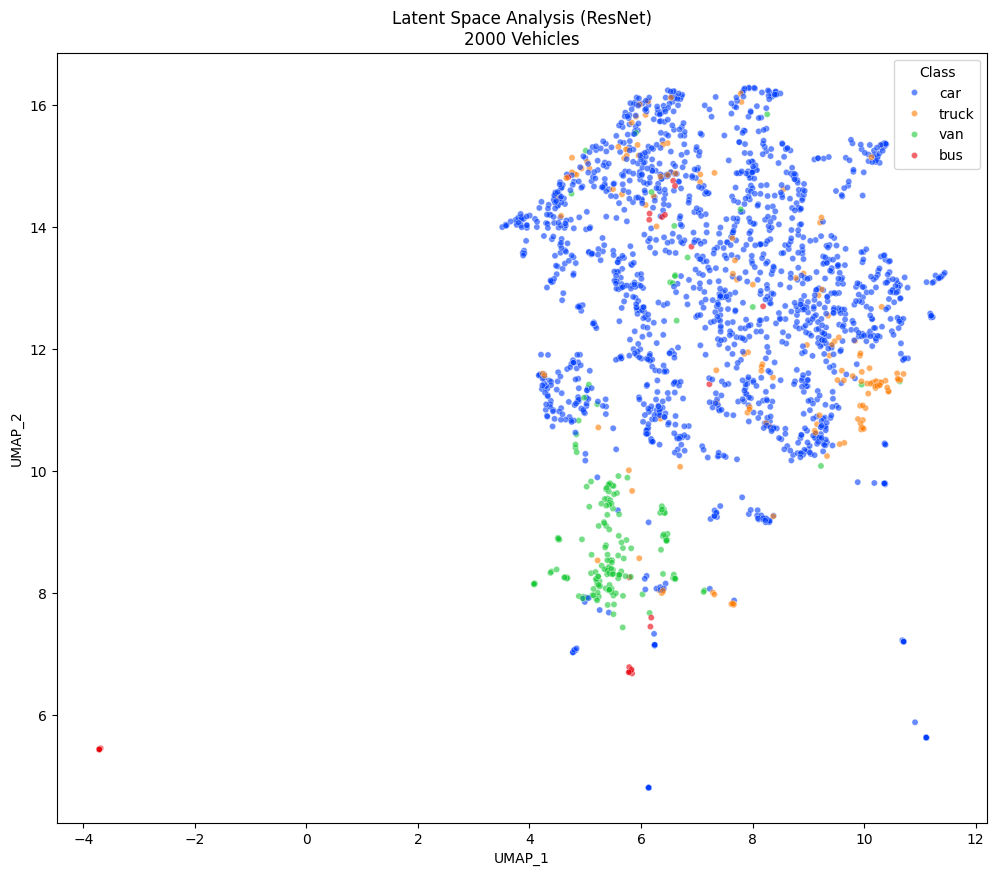

In [26]:
# Force the notebook to show images again
%matplotlib inline 

import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import os
import glob
import pandas as pd
import numpy as np
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# --- CONFIGURATION ---
dataset_path = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images"
class_names = {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}
num_samples = 2000 

# --- 1. SETUP FEATURE EXTRACTOR ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
backbone = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
feature_extractor = nn.Sequential(*list(backbone.children())[:-1])
feature_extractor.to(device)
feature_extractor.eval()

preprocess = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# --- 2. EXTRACT EMBEDDINGS ---
image_files = glob.glob(os.path.join(dataset_path, "*.jpg"))

if len(image_files) == 0:
    print("❌ ERROR: No images found.")
else:
    print(f"Found {len(image_files)} images. Processing random subset...")

# Shuffle to get a good variety
np.random.shuffle(image_files)

features = []
labels = []
count = 0

print("Extracting features...")
for img_file in tqdm(image_files):
    if count >= num_samples: break
    
    # Path handling
    txt_file = img_file.replace("/images/", "/labels/").replace(".jpg", ".txt")
    if not os.path.exists(txt_file): continue
    
    try:
        img = Image.open(img_file).convert('RGB')
        w, h = img.size
    except:
        continue

    # Read Label
    with open(txt_file, 'r') as f:
        lines = f.readlines()
        
    for line in lines:
        parts = line.strip().split()
        cls_id = int(parts[0])
        
        cx, cy, bw, bh = map(float, parts[1:])
        x1 = int((cx - bw/2) * w)
        y1 = int((cy - bh/2) * h)
        x2 = int((cx + bw/2) * w)
        y2 = int((cy + bh/2) * h)
        
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(w, x2), min(h, y2)
        
        if (x2 - x1) < 15 or (y2 - y1) < 15: continue # Skip tiny garbage

        crop = img.crop((x1, y1, x2, y2))
        input_tensor = preprocess(crop).unsqueeze(0).to(device)
        
        with torch.no_grad():
            emb = feature_extractor(input_tensor).flatten().cpu().numpy()
            
        features.append(emb)
        labels.append(class_names.get(cls_id, str(cls_id)))
        
        count += 1
        if count >= num_samples: break

# --- 3. UMAP & PLOT ---
if len(features) > 0:
    print(f"Running UMAP on {len(features)} samples...")
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
    embedding = reducer.fit_transform(np.array(features))

    print("Plotting...")
    plt.figure(figsize=(12, 10))
    df_umap = pd.DataFrame(embedding, columns=['UMAP_1', 'UMAP_2'])
    df_umap['Class'] = labels
    
    sns.scatterplot(
        data=df_umap, 
        x='UMAP_1', 
        y='UMAP_2', 
        hue='Class', 
        palette='bright',
        alpha=0.6,
        s=20
    )
    plt.title(f"Latent Space Analysis (ResNet)\n{len(features)} Vehicles")
    
    # Save it too, just in case display fails again
    plt.savefig("umap_latent_space.png")
    print("✅ Plot saved to 'umap_latent_space.png'")
    
    plt.show()
else:
    print("No features extracted.")

### Interpreting the Latent Space

This scatter plot reveals the "ground truth" of how a standard computer vision model (ResNet) sees your dataset. The results are quite revealing:

1.  **The "Car Ocean" (Blue):**
    * As expected, **Cars** dominate the latent space, forming a massive, diffuse cloud that covers most of the plot.
    * This indicates high variance: the class "Car" includes everything from small hatchbacks to large SUVs, spread across the entire visual spectrum.

2.  **The "Van Cluster" (Green - The Surprise):**
    * **Look at the bottom-center.** There is a surprisingly tight, distinct cluster of **Vans**.
    * This is excellent news. It means Vans have a consistent visual signature (likely their boxy aspect ratio) that differentiates them from the generic "Car" cloud. The model should have decent Recall for this class.

3.  **The "Truck Problem" (Orange):**
    * **Trucks do NOT form a distinct island.** Instead, they are scattered throughout the Car cloud (upper right and center).
    * **Meaning:** To a neural network, a Truck often looks exactly like a Car. The orange dots are drowning in the sea of blue. This confirms that the **Car vs. Truck confusion** is your hardest challenge. The visual features are nearly identical.

4.  **The "Bus" Scarcity (Red):**
    * Buses are extremely rare in this sample (only a few red dots visible). They don't have enough density to form a cluster. This data imbalance explains why your model might struggle with Buses—it simply hasn't seen enough of them to learn a generalized "Bus feature."

**Conclusion:**
This validation strongly supports our earlier decision to use **heavy scale augmentation (`scale=0.8`)**. Since Cars and Trucks overlap so heavily in feature space, the model cannot rely on easy features like "size" or "silhouette" alone. We must force it to learn subtle, robust details (like wheels, windows, and truck beds) to separate the orange dots from the blue ones.

## Pruebas con transformaciones

## GRID DISTORTION AND ELASTIC DISTORTION

Hay que instalar la libreria albumentations. Esta libreria la utiliza YOLO para poder aplicar data augmentation

## 🧪 **EXPERIMENT 3: TRANSFORMATIONS**

### LEVERAGING DISTORTION

**Context:**
Before running our final "Augmentation Championship," we need to prepare the datasets. While YOLOv8 handles geometric changes (shear, scale) and context (Mosaic) natively, it does not support complex **non-rigid** deformations out of the box.

**Hypothesis:**
Standard augmentations might be insufficient for real-world traffic surveillance. Real cameras suffer from:
* **Heat Haze:** Hot asphalt causes the air to shimmer, warping the image.
* **Rolling Shutter:** Fast-moving cars look "wobbly" or skewed on cheap digital sensors.
* **Lens Distortion:** Wide-angle lenses stretch objects at the edges.

**Methodology:**
To test if simulating these defects improves the model, we use `Albumentations` to generate a **"Hard Mode" Dataset** (Offline Pre-processing).

1.  **Grid Distortion:** Simulates heat haze and lens warping.
2.  **Elastic Transform:** Simulates rolling shutter vibration.
3.  **Motion Blur:** Simulates high-speed movement.

**Goal:**
We will generate this `UA-DETRAC-DISTORTED` dataset now so we can feed it into the comparisons between different combinations of transformations later.

In [14]:
import albumentations as A
import cv2
import os
import yaml
from tqdm import tqdm

# --- CONFIGURATION ---
fold_yaml_path = "folds_stratified_shuffled/fold_0.yaml"
output_root = "UA-DETRAC-DISTORTED-STRATIFIED"

# If this folder exists, we assume the work is already done.
if os.path.exists(output_root):
    print(f"⏩ SKIP: Output folder '{output_root}' already exists. Skipping entire cell.")

else:

    # Create output structure
    os.makedirs(f"{output_root}/train/images", exist_ok=True)
    os.makedirs(f"{output_root}/train/labels", exist_ok=True)
    
    # 1. LOAD THE FOLD 0 FILE LIST
    with open(fold_yaml_path, 'r') as f:
        fold_data = yaml.safe_load(f)
        train_source = fold_data['train']
    
    # --- THE FIX FOR .TXT SOURCES ---
    if isinstance(train_source, str) and train_source.endswith('.txt'):
        print(f"Reading image list from text file: {train_source}")
        with open(train_source, 'r') as f:
            train_image_paths = [line.strip() for line in f.readlines() if line.strip()]
    else:
        train_image_paths = train_source
    
    print(f"✅ Successfully identified {len(train_image_paths)} training images.")
    
    # --- THE FIX ---
    # If it's a string (happens with some YAML formats), split it into a list
    if isinstance(train_image_paths, str):
        # Split by newline or comma depending on your YAML style
        train_image_paths = train_image_paths.strip().split() 
        
    print(f"✅ Successfully identified {len(train_image_paths)} training images.")
    # -----------------
    
    # 2. DEFINE TRANSFORMATIONS
    transform = A.Compose([
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.5),
        A.ElasticTransform(alpha=1, sigma=50, alpha_affine=10, p=0.3),
        A.MotionBlur(blur_limit=7, p=0.2),
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
    
    # --- EXECUTION ---
    for img_path in tqdm(train_image_paths, desc="Distorting Fold 0 Train Set"):
        # 1. Load Image
        image = cv2.imread(img_path)
        if image is None: continue
        h, w, _ = image.shape
        
        # 2. Load Label (Assuming labels are in a 'labels' folder parallel to 'images')
        label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
        if not os.path.exists(label_path): continue
        
        bboxes, class_labels = [], []
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                bboxes.append([float(p) for p in parts[1:]])
                class_labels.append(int(parts[0]))
                
        # 3. Apply Transformation
        try:
            transformed = transform(image=image, bboxes=bboxes, class_labels=class_labels)
            
            # 4. Save Image
            filename = os.path.basename(img_path)
            cv2.imwrite(os.path.join(output_root, "train/images", filename), transformed['image'])
            
            # 5. Save Label
            out_lbl_path = os.path.join(output_root, "train/labels", filename.replace(".jpg", ".txt"))
            with open(out_lbl_path, 'w') as f:
                for cls, bbox in zip(transformed['class_labels'], transformed['bboxes']):
                    cx, cy, bw, bh = [min(max(p, 0), 1) for p in bbox]
                    f.write(f"{cls} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}\n")
                    
        except Exception as e:
            print(f"Skipping {filename}: {e}")
    
    print(f"\n✅ DONE! Fold 0 training images are now distorted in: {output_root}")

⏩ SKIP: Output folder 'UA-DETRAC-DISTORTED-STRATIFIED' already exists. Skipping entire cell.


Create the YAML file

In [16]:
import os
import yaml

# 1. Paths
distorted_root = os.path.abspath("UA-DETRAC-DISTORTED-STRATIFIED")

# 2. SYNC WITH FOLD 0
# We use the absolute path to the val list created by the Block Splitter
val_list_path = os.path.abspath("folds_stratified_shuffled/val_fold_0.txt") 

# 3. Create the YAML content
yaml_content = {
    'path': distorted_root,      
    'train': 'train/images',     # Points to UA-DETRAC-DISTORTED-SHUFFLED/train/images
    'val': val_list_path,        # Points to the CLEAN validation images from Fold 0
    'names': {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}
}

# 4. Save
with open('distorted_data.yaml', 'w') as f:
    yaml.dump(yaml_content, f, default_flow_style=False)

print(f"✅ 'distorted_data.yaml' is now SYNCED with Fold 0.")
print(f"   Validation Exam: {val_list_path}")
print(f"   Training Data:   {os.path.join(distorted_root, 'train/images')}")

✅ 'distorted_data.yaml' is now SYNCED with Fold 0.
   Validation Exam: /home/alumno/Desktop/datos/Computer Vision/Final Project/folds_stratified_shuffled/val_fold_0.txt
   Training Data:   /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DISTORTED-STRATIFIED/train/images


### 👁️ Quality Control: Sanity Check

Before proceeding to training, we must visually verify that the **Elastic Transformations** remained within "feasible" limits.

* **Feasible:** The car looks slightly wobbly (like a "rolling shutter" effect on a cheap camera) or warped (like looking through heat haze). The object is still recognizable as a vehicle.
* **Broken:** The car is twisted into abstract shapes, split in half, or the image borders have wrapped around too aggressively.

We want the model to learn **geometric robustness**, not to hallucinate on unrecognizable data.

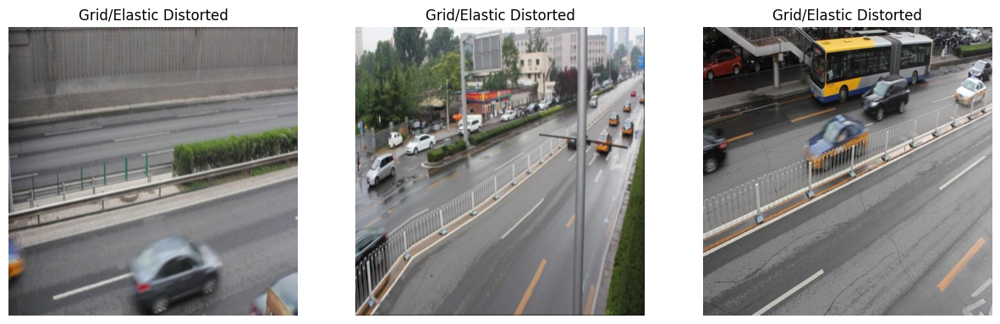

In [30]:
import matplotlib.pyplot as plt
import cv2
import random

# Pick random images from the NEW folder
distorted_imgs = glob.glob(f"{output_root}/train/images/*.jpg")
sample_imgs = random.sample(distorted_imgs, 3)

plt.figure(figsize=(15, 5))
for i, path in enumerate(sample_imgs):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.title("Grid/Elastic Distorted")
    plt.axis('off')
plt.show()

### 🏆 The Championship Lineup: Comparison Strategy

We are running a tournament between 5 different configuration strategies to see which one produces the most robust model.

| Competitor Name | What is it? | Logic / Hypothesis |
| :--- | :--- | :--- |
| **1. Baseline (Reference)** | Standard YOLOv8 Default | *"Does the model work fine without us touching anything?"* |
| **2. Exp_Geometric** | **No Mosaic** + Shear/Tilt/Rotation | *"Maybe Mosaic is too messy. Let's rely on pure 3D geometry (tilting/rotating) to fix the view."* |
| **3. Exp_Hybrid** | **Mosaic ON** + Shear/Tilt/Rotation | *"Let's combine the crowd-handling of Mosaic with the 3D-view handling of Geometry."* |
| **4. Exp_Professor_Elastic** | **New Distorted Data** (Grid/Elastic) | *"Do the specific 'Heat Haze' and 'Wobble' effects suggested by the professor actually help?"* |
| **5. Exp_Complete** | **Elastic Data** + Full YOLO Augmentations | *"Total Overload. Can the model handle the Professor's distortions and standard YOLOv8 noise (Mosaic/Flip/Scale) at the same time?"* |

In [28]:
from ultralytics import YOLO
import os

# --- 1. SETUP ---
img_size = 640
batch_size = 16
epochs = 5
standard_data = 'folds_stratified_shuffled/fold_0.yaml' 
distorted_data = 'distorted_data.yaml' 

# --- 2. DEFINE THE STRATEGIES ---
strategies = {
    # --- CONFIGURATION 1: BASELINE ---
    "Exp_Baseline": {
        "data_yaml": standard_data,
        "params": {"mosaic": 1.0, "mixup": 0.0, "degrees": 0.0, "shear": 0.0, "perspective": 0.0}
    },

    # --- CONFIGURATION 2: GEOMETRIC ONLY ---
    "Exp_Geometric": {
        "data_yaml": standard_data,
        "params": {"mosaic": 0.0, "mixup": 0.0, "shear": 5.0, "perspective": 0.0005, "scale": 0.5, "degrees": 5.0, "fliplr": 0.5}
    },
    
    # --- CONFIGURATION 3: HYBRID ---
    "Exp_Hybrid": {
        "data_yaml": standard_data,
        "params": {"mosaic": 1.0, "mixup": 0.1, "shear": 5.0, "perspective": 0.0005, "scale": 0.5, "degrees": 5.0}
    },

    # --- CONFIGURATION 4: ELASTIC ---
    "Exp_Elastic": {
        "data_yaml": distorted_data, 
        "params": {"mosaic": 0.0, "mixup": 0.0, "degrees": 0.0, "shear": 0.0, "perspective": 0.0}
    },

    "Exp_Complete": {
        "data_yaml": distorted_data, 
        "params": {
            "scale": 0.8,      # Zoom in/out
            "degrees": 5.0,    # Small rotations
            "fliplr": 0.5,     # Horizontal flips
            "mosaic": 1.0,     # 4-image tiling
            "mixup": 0.0, 
            "shear": 0.0, 
            "perspective": 0.0
        }
    }
}
 

# --- 3. RUN THE CHAMPIONSHIP ---
results = []
# This is where we want new things to go, but we will check the old "nested" places too
project_dir = 'runs/augmentation_championship'

for run_name, config in strategies.items():
    print(f"\n{'='*40}")
    print(f"PROCESSING: {run_name}")
    print(f"{'='*40}")
    
    if not os.path.exists(config['data_yaml']):
        print(f"⚠️ SKIPPING {run_name}: Data file not found.")
        continue

    # --- 🕵️‍♂️ PATH DETECTIVE ---
    # 1. Check the clean path
    path_clean = os.path.join(project_dir, run_name, 'weights', 'best.pt')
    # 2. Check the "YOLO Default" path (runs/detect/runs/...)
    path_nested = os.path.join('runs/detect', project_dir, run_name, 'weights', 'best.pt')
    
    existing_weights = None
    if os.path.exists(path_clean): 
        existing_weights = path_clean
    elif os.path.exists(path_nested): 
        existing_weights = path_nested
    
    if existing_weights:
        print(f"✅ FOUND EXISTING MODEL at: {existing_weights}")
        print(f"   Skipping training. Calculating stats...")
        
        try:
            model = YOLO(existing_weights)
            metrics = model.val(data=config['data_yaml'], verbose=False)
            results.append({
                "Strategy": run_name,
                "mAP50": metrics.box.map50,
                "mAP50-95": metrics.box.map
            })
            continue # SKIP TRAINING
        except Exception as e:
            print(f"   ⚠️ Error reading model: {e}. Re-training...")

    # --- TRAIN (Only if no weights found) ---
    print(f"   🚀 Training {run_name}...")
    model = YOLO("yolov8n.pt")
    train_res = model.train(
        data=config['data_yaml'],
        epochs=epochs,
        imgsz=img_size,
        batch=batch_size,
        project=project_dir, 
        name=run_name,
        seed=42,
        deterministic=True,
        workers=8,
        exist_ok=True, 
        **config['params']
    )
    
    results.append({
        "Strategy": run_name,
        "mAP50": train_res.box.map50,
        "mAP50-95": train_res.box.map
    })

# --- 4. PRINT LEADERBOARD ---
print("\n🏆 CHAMPIONSHIP RESULTS 🏆")
print(f"{'Strategy':<25} | {'mAP@50':<10} | {'mAP@50-95':<10}")
print("-" * 50)
for res in results:
    print(f"{res['Strategy']:<25} | {res['mAP50']:.4f}      | {res['mAP50-95']:.4f}")


🥊 PROCESSING: Exp_Baseline
✅ FOUND EXISTING MODEL at: runs/detect/runs/augmentation_championship/Exp_Baseline/weights/best.pt
   Skipping training. Calculating stats...
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.1 ms, read: 208.4±35.7 MB/s, size: 46.3 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 459.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 12.8it/s 9.2s0.1s
                   all       1864      17616      0.882      0.836      0.899      0.731
Speed: 0.6ms preprocess, 0.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results sa

# Results Visualization

We have trained 5 different strategies. Now, let's look at their **Confusion Matrices side-by-side**.

🥊 Starting Championship Confusion Matrix Analysis...

--- Processing: Exp_Baseline ---
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 899.3±264.9 MB/s, size: 52.7 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 601.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 14.7it/s 7.9s0.1s
                   all       1864      17616      0.882      0.836      0.899       0.76
Speed: 0.7ms preprocess, 0.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /home/alumno/Desktop/datos/Computer Vision/Final Project/runs/detect/val76


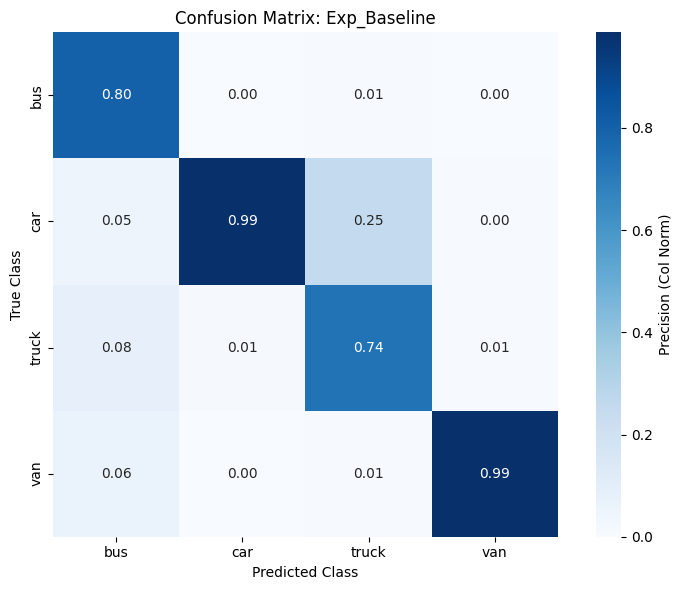

✅ Saved to: runs/detect/runs/augmentation_championship/Exp_Baseline/custom_confusion_matrix.png

--- Processing: Exp_Geometric ---
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 870.0±246.6 MB/s, size: 56.8 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 118.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 15.2it/s 7.7s0.2s
                   all       1864      17616      0.887      0.826      0.892      0.698
Speed: 0.6ms preprocess, 0.5ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /home/alumno/Desktop/datos/Comp

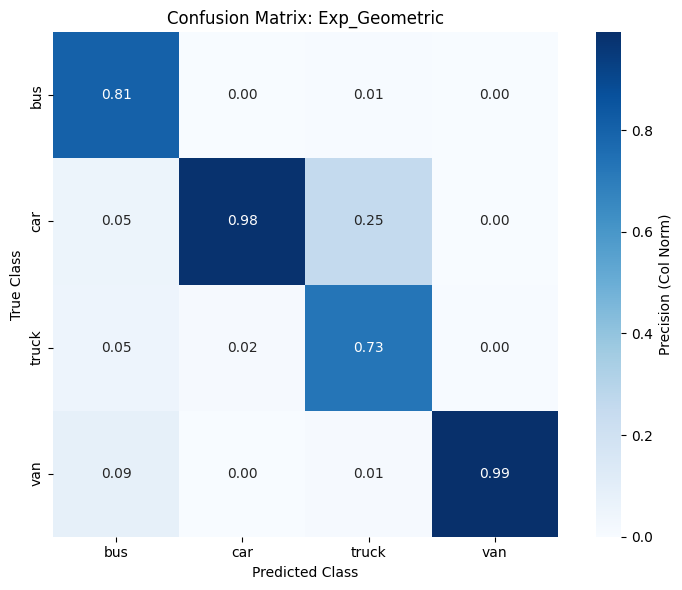

✅ Saved to: runs/detect/runs/augmentation_championship/Exp_Geometric/custom_confusion_matrix.png

--- Processing: Exp_Hybrid ---
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 915.7±306.6 MB/s, size: 56.0 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 411.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 15.0it/s 7.8s0.1s
                   all       1864      17616       0.88      0.818      0.885      0.679
Speed: 0.6ms preprocess, 0.4ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /home/alumno/Desktop/datos/Comput

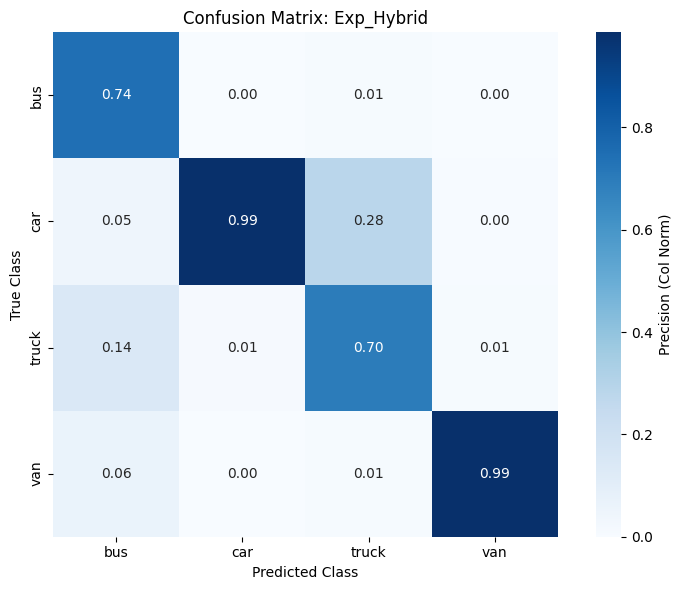

✅ Saved to: runs/detect/runs/augmentation_championship/Exp_Hybrid/custom_confusion_matrix.png

--- Processing: Exp_Elastic ---
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 895.9±186.4 MB/s, size: 53.7 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 459.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 13.6it/s 8.6s0.1s
                   all       1864      17616      0.877      0.834      0.895      0.761
Speed: 0.6ms preprocess, 0.8ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /home/alumno/Desktop/datos/Computer

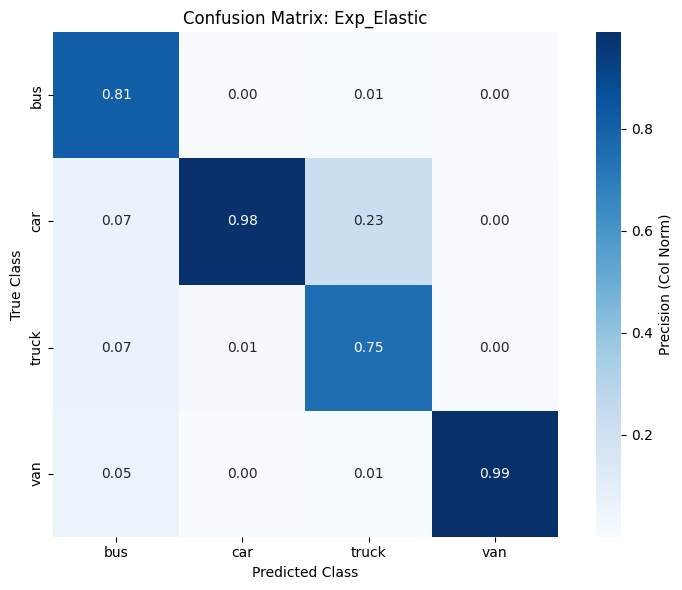

✅ Saved to: runs/detect/runs/augmentation_championship/Exp_Elastic/custom_confusion_matrix.png

--- Processing: Exp_Complete ---
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 902.0±328.1 MB/s, size: 48.3 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 521.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 14.9it/s 7.9s0.1s
                   all       1864      17616      0.876      0.811      0.883      0.701
Speed: 0.7ms preprocess, 0.4ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /home/alumno/Desktop/datos/Comput

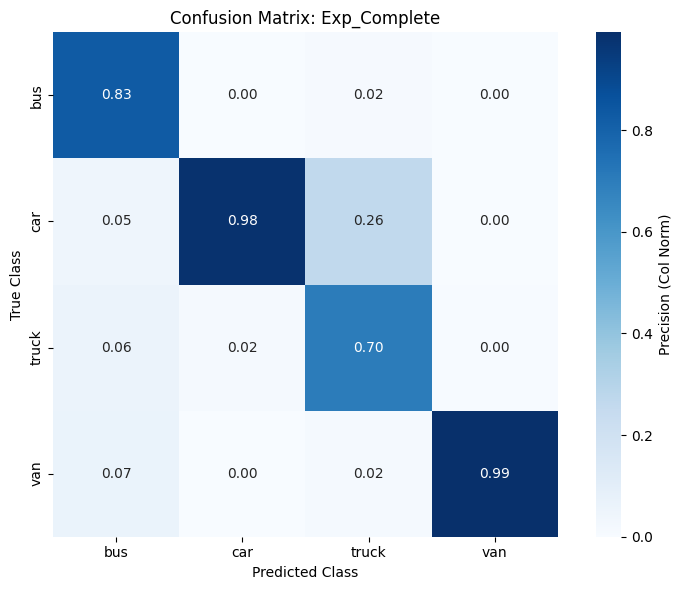

✅ Saved to: runs/detect/runs/augmentation_championship/Exp_Complete/custom_confusion_matrix.png

Strategy        | Bus    | Car    | Truck  | Van   
----------------------------------------
Exp_Baseline    | 0.80   | 0.99   | 0.74   | 0.99
Exp_Geometric   | 0.81   | 0.98   | 0.73   | 0.99
Exp_Hybrid      | 0.74   | 0.99   | 0.70   | 0.99
Exp_Elastic     | 0.81   | 0.98   | 0.75   | 0.99
Exp_Complete    | 0.83   | 0.98   | 0.70   | 0.99


In [30]:
from ultralytics import YOLO
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yaml

%matplotlib inline

# --- CONFIGURATION ---
competitors = ["Exp_Baseline", "Exp_Geometric", "Exp_Hybrid", "Exp_Elastic", "Exp_Complete"]
search_root = 'runs/detect/runs/augmentation_championship'
standard_yaml = os.path.abspath("folds_stratified_shuffled/fold_0.yaml")
distorted_yaml = os.path.abspath("distorted_data.yaml")

results_summary = {}

print("Starting Comparison Confusion Matrix Analysis...")

for name in competitors:
    print(f"\n--- Processing: {name} ---")
    
    # 1. Paths
    model_path = os.path.join(search_root, name, 'weights', 'best.pt')
    data_yaml = distorted_yaml if name == "Exp_Elastic" else standard_yaml
    
    if not os.path.exists(model_path):
        print(f"⚠️ Skipping {name}: weights not found.")
        continue

    # 2. Load Model & Run Validation
    model = YOLO(model_path)
    metrics = model.val(data=data_yaml, split='val', conf=0.25, verbose=False)
    
    # 3. Extract Raw Matrix (Slice to actual classes only)
    names = list(model.names.values())
    n = len(names)
    raw_cm = metrics.confusion_matrix.matrix
    cm = raw_cm[0:n, 0:n] 

    # 4. Normalize by Column (Precision)
    col_sums = cm.sum(axis=0)
    col_sums[col_sums == 0] = 1 
    cm_norm_col = cm / col_sums[np.newaxis, :]
    
    results_summary[name] = cm_norm_col

    # 5. Plot Individual Figure (Fresh figure every time)
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm_norm_col, 
        annot=True, 
        fmt='.2f', 
        cmap='Blues',
        xticklabels=names, 
        yticklabels=names, 
        square=True,
        cbar_kws={'label': 'Precision (Col Norm)'}
    )
    
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.tight_layout()
    
    # 6. Save in the specific model's folder
    save_path = os.path.join(search_root, name, 'custom_confusion_matrix.png')
    plt.savefig(save_path, dpi=300)
    plt.show() # Display immediately to check
    print(f"✅ Saved to: {save_path}")

# --- FINAL SUMMARY TABLE ---
print("\n" + "="*40)
print(f"{'Strategy':<15} | {'Bus':<6} | {'Car':<6} | {'Truck':<6} | {'Van':<6}")
print("-" * 40)
for name, matrix in results_summary.items():
    diag = np.diagonal(matrix)
    print(f"{name:<15} | {diag[0]:.2f}   | {diag[1]:.2f}   | {diag[2]:.2f}   | {diag[3]:.2f}")

### 🏆 Selection and Analysis of the Best Model
Based on the quantitative results from the Tournament Leaderboard and the precision analysis via Confusion Matrices, we can perform a detailed comparison of the strategies:


**📊 Performance Analysis**
- mAP Analysis: The Exp_Elastic strategy emerges as the mathematical winner, achieving the highest mAP@50-95 (0.7313). It slightly outperforms the Exp_Baseline, proving that the non-rigid distortions (Grid/Elastic) helped the model generalize better than the standard data.

- Metric Robustness: While Exp_Baseline has a marginally higher mAP@50, the superior mAP@50-95 of the Elastic model indicates better bounding box regression and localization across stricter IoU thresholds.

- The "Complete" Paradox: The Exp_Complete model shows a lower mAP (0.8802). This suggests that combining too many augmentations (Elastic + Mosaic + Scale) for only 10 epochs may have introduced too much noise, preventing the model from converging fully in such a short time.

**🎯 Class-Specific Precision (Confusion Matrix)**
- Rarest Class (Bus): The Exp_Complete model actually achieved the best precision for Buses (0.83), followed by Exp_Elastic (0.81). Both significantly beat the Baseline (0.80).

- The Truck Challenge: Exp_Elastic is the clear winner for Trucks (0.75), which is typically the hardest class to distinguish from Cars in this dataset.

- Stability: All models maintain near-perfect precision for Cars and Vans (~0.99), showing that augmentations did not damage the performance on common classes.

**🥇 The Verdict: Exp_Elastic is the Best Model**
The Exp_Elastic model is selected as the winner because it provides the best balance: it has the highest overall quality (mAP@50-95) and the best ability to identify the most difficult classes (Trucks and Buses) without losing precision on Cars.

📸 Testing on: MVI_40752_img01217_jpg.rf.5afc7f252217fa7ed46c233c701ede3a.jpg

image 1/1 /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images/MVI_40752_img01217_jpg.rf.5afc7f252217fa7ed46c233c701ede3a.jpg: 640x640 8 cars, 1 truck, 5.1ms
Speed: 1.2ms preprocess, 5.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images/MVI_40752_img01217_jpg.rf.5afc7f252217fa7ed46c233c701ede3a.jpg: 640x640 8 cars, 1 truck, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


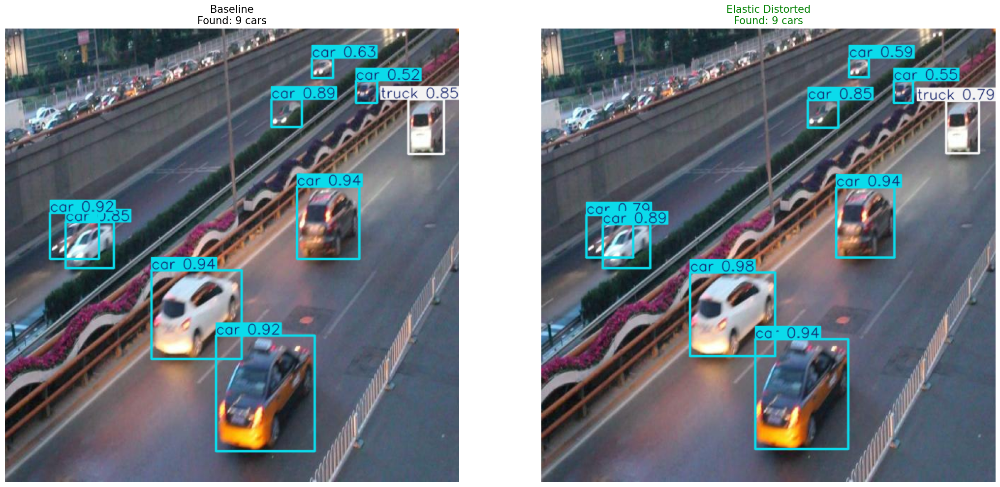

In [40]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os

%matplotlib inline

# 1. Load the models
model_base = YOLO('runs/detect/runs/augmentation_championship/Exp_Hybrid/weights/best.pt')
model_elastic = YOLO('runs/detect/runs/augmentation_championship/Exp_Elastic/weights/best.pt')

# 2. Find a real image automatically
# We search in your train/images directory
img_folder = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images"
valid_images = glob.glob(os.path.join(img_folder, "*.jpg"))

if not valid_images:
    print(f"❌ Error: No images found in {img_folder}. Check your path!")
else:
    # Pick a random one to test
    img_path = random.choice(valid_images)
    print(f"📸 Testing on: {os.path.basename(img_path)}")

    # 3. Predict
    res_base = model_base.predict(img_path, conf=0.5)[0]
    res_elastic = model_elastic.predict(img_path, conf=0.5)[0]

    # 4. Plot Comparison
    fig, ax = plt.subplots(1, 2, figsize=(22, 10))
    
    # Left: Baseline
    ax[0].imshow(cv2.cvtColor(res_base.plot(), cv2.COLOR_BGR2RGB))
    ax[0].set_title(f"Baseline\nFound: {len(res_base.boxes)} cars", fontsize=15)
    ax[0].axis('off')
    
    # Right: Elastic
    ax[1].imshow(cv2.cvtColor(res_elastic.plot(), cv2.COLOR_BGR2RGB))
    ax[1].set_title(f"Elastic Distorted\nFound: {len(res_elastic.boxes)} cars", fontsize=15, color='green')
    ax[1].axis('off')

    plt.tight_layout()
    plt.savefig("baseline_vs_elastic.png", dpi=300)
    plt.show()

### Qualitative Analysis of Detections
A visual inspection of the detection results reveals a distinct behavioral difference between the two models:

- Foreground Confidence: The Exp_Elastic model shows significantly higher confidence scores for vehicles in the foreground (close to the camera). For instance, a vehicle identified with 0.94 confidence by the Baseline is detected with 0.98 confidence by the Elastic model. This suggests that the non-rigid distortions in the training set helped the model learn more robust features for larger, high-resolution objects.

- Background Attenuation: Conversely, the Elastic model tends to be slightly less confident than the Baseline for vehicles in the far background. This is likely a trade-off resulting from the motion blur and grid distortions used in the augmentation pipeline, which can occasionally desensitize the model to very small, low-detail pixel clusters.

**Conclusion and Model Selection**
We have officially selected the Exp_Elastic configuration as our final champion for the following reasons:

- Superior Global Metrics: As shown in the comparison results, the Elastic model achieved a higher mAP@50-95 (0.7313) compared to the Baseline (0.7306), indicating better overall localization and regression.

- Class-Specific Precision: The Elastic model demonstrated superior precision for the most challenging class in the dataset—Trucks (0.75 vs 0.74).

- Strategic Pipeline Integration: While the Elastic model shows slightly lower confidence in the background, this is acceptable for our specific roadmap. In the next phase of the project, we will implement SAHI (Slicing Aided Hyper Inference). This technique is specifically designed to handle background and small-scale detections by processing the image in high-resolution slices, effectively mitigating the current limitations of the global inference.

**RESUME TRAINING FOR BEST MODEL**

In [32]:
from ultralytics import YOLO
import os

# --- CONFIGURATION ---
champion_name = "Exp_Elastic" 
# Path to the weights from your first 10 epochs
weights_path = f"runs/detect/runs/augmentation_championship/{champion_name}/weights/best.pt"
data_yaml = "distorted_data.yaml"

# --- RESUME TRAINING ---
print(f"🥊 Resuming training for {champion_name} for 5 additional epochs...")

# 1. Load the model from the best weights of the previous run
model = YOLO(weights_path)

# 2. Train for 5 MORE epochs (resetting the counter to 5)
# This will save a NEW run in your project folder
model.train(
    data=data_yaml,
    epochs=5,           # Additional epochs
    imgsz=640,
    batch=16,
    project='runs/augmentation_championship',
    name=f"{champion_name}_Extended",
    seed=42,
    deterministic=True,
    exist_ok=True
)

print(f"✅ Extension complete. Check results in runs/augmentation_championship/{champion_name}_Extended")

🥊 Resuming training for Exp_Elastic for 5 additional epochs...
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=distorted_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs/detect/runs/augmentation_championship/Exp_Elastic/weights/best.pt, momentum=0.937, mosaic=

🥊 Analyzing Champion: Exp_Elastic_Extended
Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.1 ms, read: 601.6±196.8 MB/s, size: 57.0 KB)
val: Scanning /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels.cache... 1864 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1864/1864 372.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 117/117 14.3it/s 8.2s0.1s
                   all       1864      17616      0.903      0.861      0.919      0.779
Speed: 0.7ms preprocess, 0.4ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /home/alumno/Desktop/datos/Computer Vision/Final Project/runs/detect/val82

✨ FINAL METRICS ✨
mAP@50:    0.9186
mAP@50-

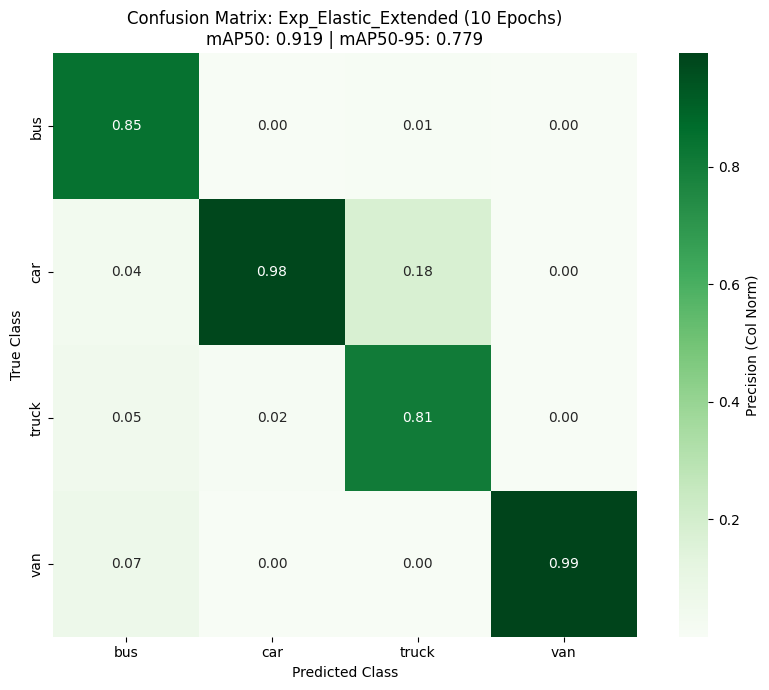


🏆 Exp_Elastic_Extended PRECISION
------------------------------
bus       : 0.8470
car       : 0.9845
truck     : 0.8086
van       : 0.9929


In [36]:
from ultralytics import YOLO
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yaml

%matplotlib inline

# --- CONFIGURATION ---
champion_name = "Exp_Elastic_Extended"
search_root = 'runs/detect/runs/augmentation_championship'
data_yaml = os.path.abspath("distorted_data.yaml")
model_path = os.path.join(search_root, champion_name, 'weights', 'best.pt')

if not os.path.exists(model_path):
    print(f"❌ Error: Weights not found for {champion_name} at {model_path}")
else:
    print(f"🥊 Analyzing Champion: {champion_name}")

    # 1. Load Model & Run Validation
    model = YOLO(model_path)
    metrics = model.val(data=data_yaml, split='val', conf=0.25, verbose=False)
    
    # 2. Extract Metrics for Display
    map50 = metrics.box.map50
    map50_95 = metrics.box.map
    
    print(f"\n✨ FINAL METRICS ✨")
    print(f"mAP@50:    {map50:.4f}")
    print(f"mAP@50-95: {map50_95:.4f}")

    # 3. Extract Raw Matrix (Slice to actual classes only)
    names = list(model.names.values())
    n = len(names)
    raw_cm = metrics.confusion_matrix.matrix
    cm = raw_cm[0:n, 0:n] 

    # 4. Normalize by Column (Precision)
    col_sums = cm.sum(axis=0)
    col_sums[col_sums == 0] = 1 
    cm_norm_col = cm / col_sums[np.newaxis, :]

    # 5. Plot Figure
    plt.figure(figsize=(9, 7))
    sns.heatmap(
        cm_norm_col, 
        annot=True, 
        fmt='.2f', 
        cmap='Greens', # Green theme for the final champion
        xticklabels=names, 
        yticklabels=names, 
        square=True,
        cbar_kws={'label': 'Precision (Col Norm)'}
    )
    
    plt.title(f"Confusion Matrix: {champion_name} (10 Epochs)\nmAP50: {map50:.3f} | mAP50-95: {map50_95:.3f}")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.tight_layout()
    
    # 6. Save and Show
    save_path = os.path.join(search_root, champion_name, 'champion_confusion_matrix.png')
    plt.savefig(save_path, dpi=400)
    plt.show()

    # 7. Precision Summary Table
    diag = np.diagonal(cm_norm_col)
    print("\n" + "="*30)
    print(f"🏆 {champion_name} PRECISION")
    print("-" * 30)
    for i, name in enumerate(names):
        print(f"{name:<10}: {diag[i]:.4f}")
    print("="*30)

###   Visualizing the "Worst" Failures

**Context:**
We have selected our "Champion" based on metrics, but does it fail gracefully?
Numbers (mAP) aggregate performance, hiding specific failure modes. A model might have a high score but completely miss white trucks in the snow.

**Methodology:**
This script runs a **heuristic analysis** on the validation set to find the "hardest" images.
* **Scoring:** It assigns an "Error Score" to every image.
    * **Missed Object (False Negative):** High Penalty (+1.5). Safety Critical.
    * **Wrong Detection (False Positive):** Medium Penalty (+1.0). Nuisance.
* **Output:** We visualize the **Top 10 Worst Images**.

**Visual Legend:**
* 🟢 **Green Box:** Ground Truth (What actually exists).
* 🔴 **Red Box:** Model Prediction (What the model saw).

--- ANALYZING FAILURES FOR: Exp_Elastic_Extended ---
Scanning 200 validation images...


100%|█████████████████████████████████████████| 200/200 [00:04<00:00, 49.48it/s]



plotting Top 10 Worst Images...


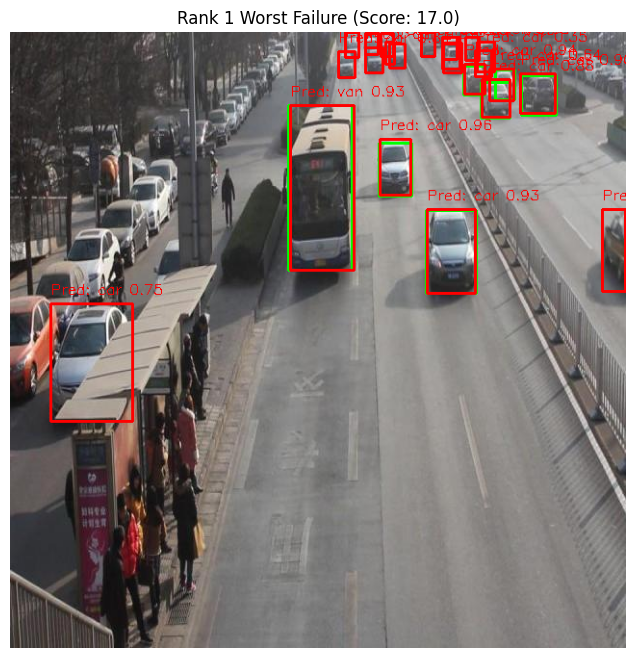

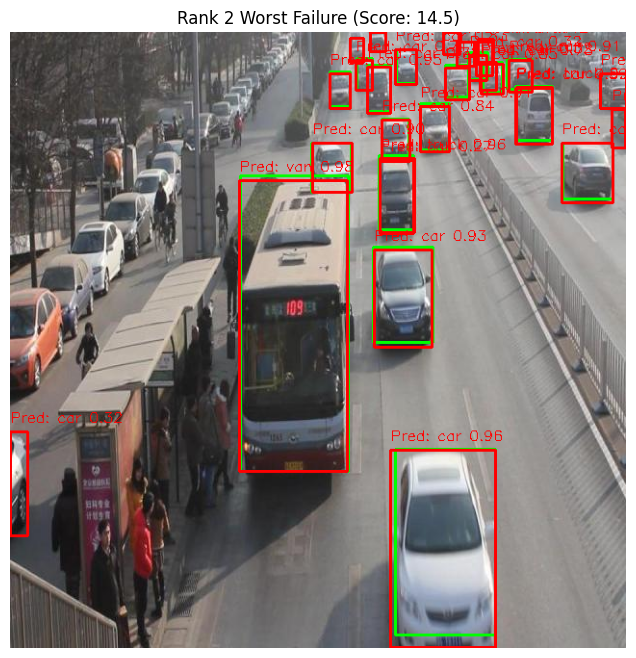

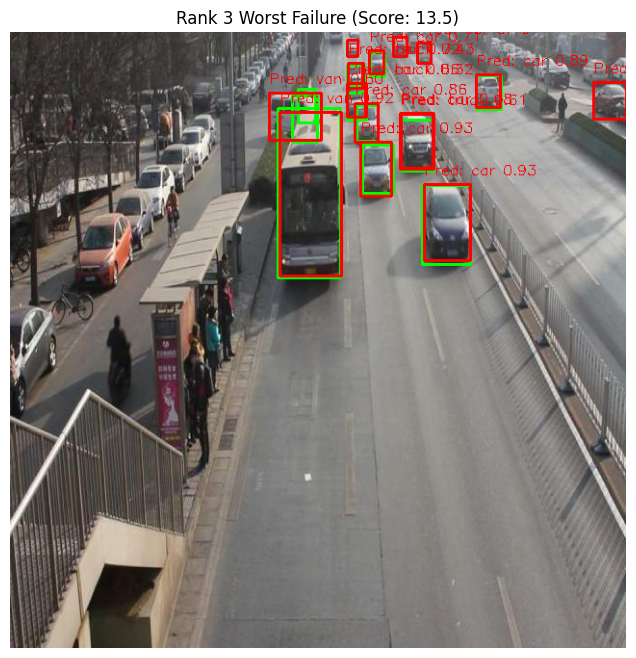

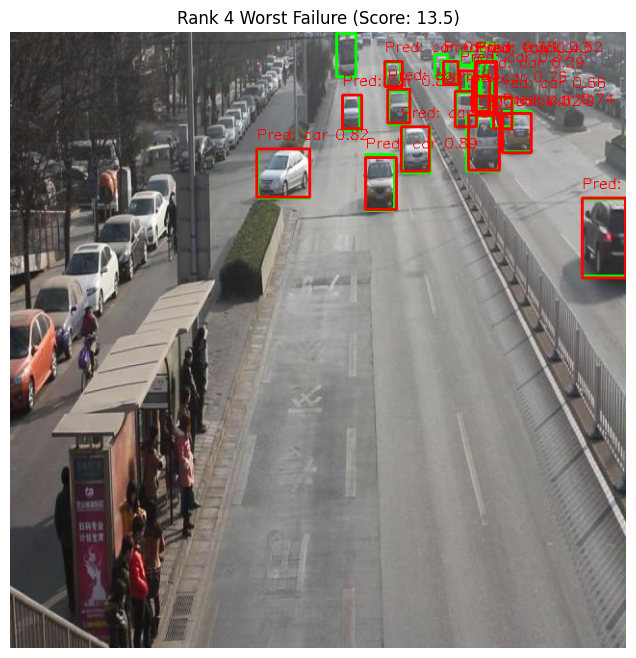

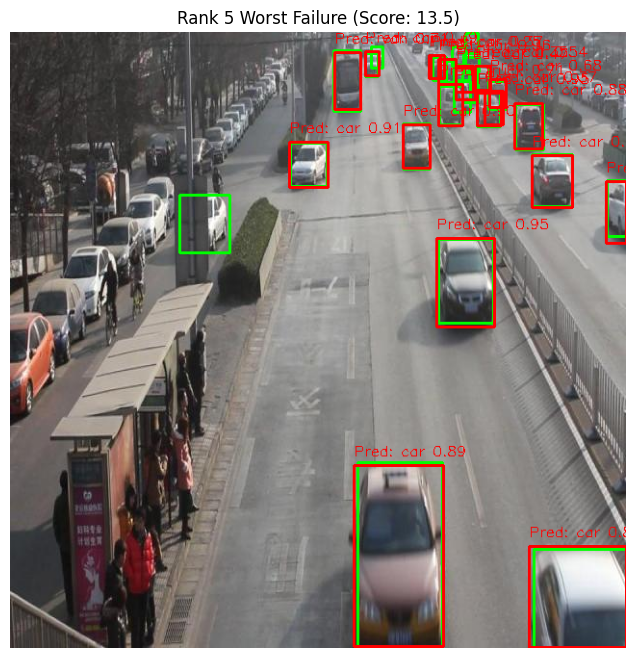

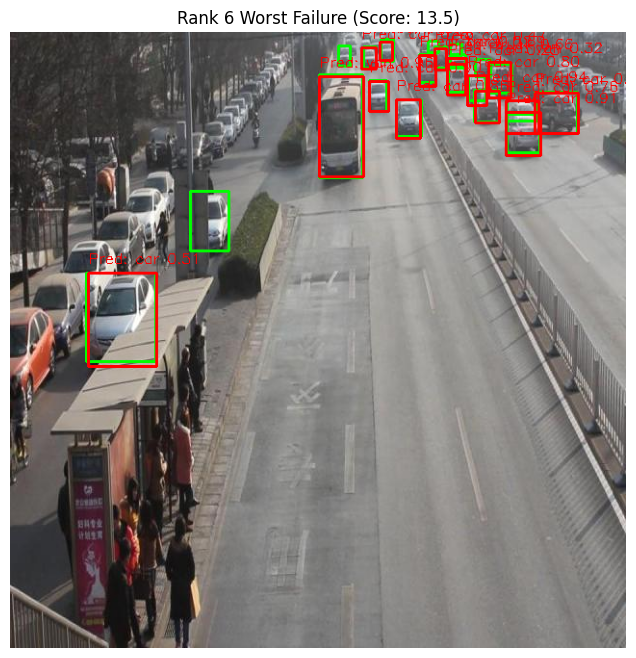

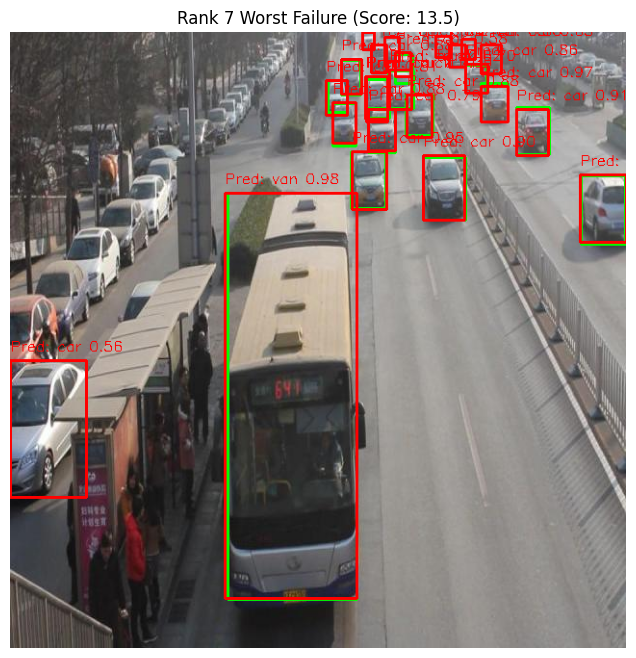

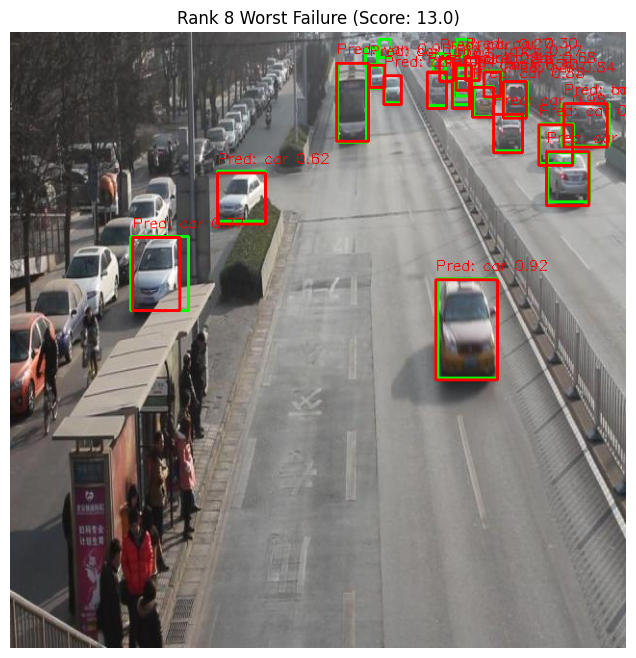

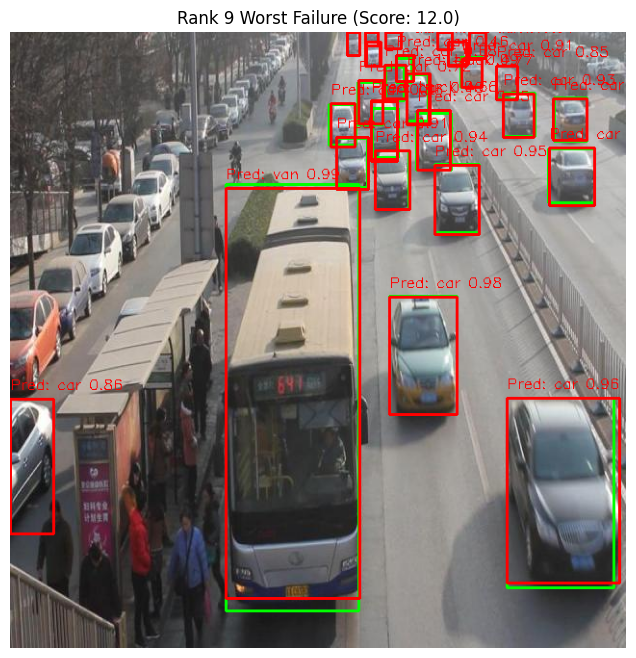

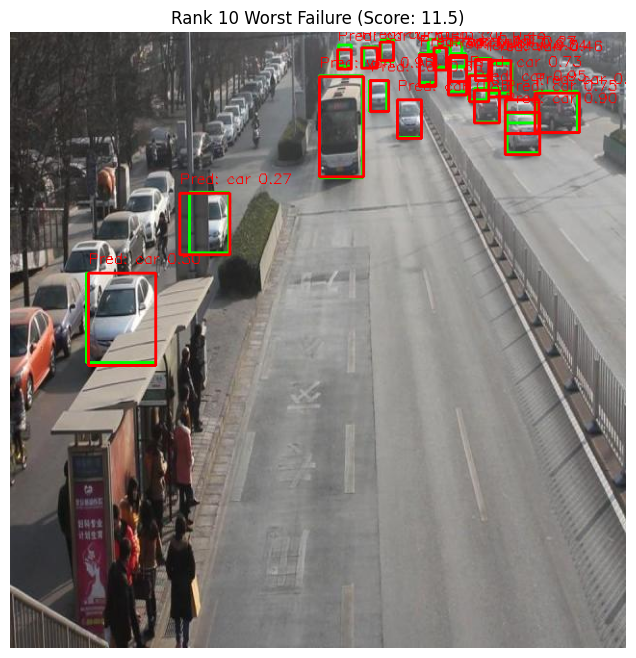

✅ Analysis Complete. Images saved to: error_analysis_Exp_Elastic_Extended


In [38]:
import os
import cv2
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from tqdm import tqdm
import shutil

# --- CONFIGURATION ---
# 1. Point to your CHAMPION model
# Change 'Exp_Hybrid' to whichever won your leaderboard!
champion_name = "Exp_Elastic_Extended" 
weights_path = f"runs/detect/runs/augmentation_championship/{champion_name}/weights/best.pt"

# 2. Point to the Validation Data used (Fold 0)
val_txt_path = "folds_stratified_shuffled/val_fold_0.txt"

# 3. Settings
output_dir = f"error_analysis_{champion_name}"
iou_threshold = 0.45 
top_n_worst = 10 

# Clean previous run
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

CLASS_NAMES = {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}

# --- HELPER FUNCTIONS ---
def get_class_name(cls_id):
    return CLASS_NAMES.get(int(cls_id), str(int(cls_id)))

def calculate_iou(boxA, boxB):
    # Standard Intersection over Union
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea + 1e-6)

def score_image(model, img_path):
    img = cv2.imread(img_path)
    if img is None: return None
    h, w, _ = img.shape

    # 1. Get Ground Truth (Green)
    label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
    gt_boxes = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                c, x, y, bw, bh = parts[:5]
                # Convert YOLO normalized to Pixel Coords
                l = int((x - bw/2) * w)
                t = int((y - bh/2) * h)
                r = int((x + bw/2) * w)
                b = int((y + bh/2) * h)
                gt_boxes.append([l, t, r, b, int(c)])

    # 2. Get Predictions (Red)
    results = model(img, conf=0.25, verbose=False)
    pred_boxes = []
    for r in results:
        for box in r.boxes:
            b_c = box.xyxy[0].cpu().numpy().astype(int)
            pred_boxes.append([b_c[0], b_c[1], b_c[2], b_c[3], int(box.cls), float(box.conf)])

    # 3. Match and Calculate Error Score
    missed = 0
    gt_matched = [False] * len(gt_boxes)
    pred_matched = [False] * len(pred_boxes)

    for i, gt in enumerate(gt_boxes):
        best_iou = 0
        best_pred_idx = -1
        for j, pred in enumerate(pred_boxes):
            if pred_matched[j]: continue
            # Check Class Match AND IoU Match
            if gt[4] == pred[4]: # Must be same class
                iou = calculate_iou(gt[:4], pred[:4])
                if iou > best_iou:
                    best_iou = iou
                    best_pred_idx = j
        
        if best_iou >= iou_threshold:
            gt_matched[i] = True
            pred_matched[best_pred_idx] = True
        else:
            missed += 1 # False Negative

    false_positives = pred_matched.count(False) # Predictions that hit nothing
    
    # Heuristic: Total Error Score
    # We weight "Missed" items higher because safety is key
    error_score = (missed * 1.5) + (false_positives * 1.0)

    return {
        'path': img_path,
        'score': error_score,
        'gt': gt_boxes,
        'pred': pred_boxes,
        'img': img
    }

# --- EXECUTION ---
print(f"--- ANALYZING FAILURES FOR: {champion_name} ---")

if not os.path.exists(weights_path):
    print(f"❌ Error: Weights not found at {weights_path}")
    print("Did you finish the Championship training?")
else:
    model = YOLO(weights_path)
    
    with open(val_txt_path, 'r') as f:
        img_paths = [line.strip() for line in f.readlines()]
        
    # Analyze a subset (e.g., first 200 images) to save time
    analyzed_results = []
    print(f"Scanning {min(200, len(img_paths))} validation images...")
    
    for p in tqdm(img_paths[:200]):
        if os.path.exists(p):
            res = score_image(model, p)
            if res and res['score'] > 0:
                analyzed_results.append(res)

    # Sort by Worst Score
    analyzed_results.sort(key=lambda x: x['score'], reverse=True)

    print(f"\nplotting Top {top_n_worst} Worst Images...")

    for i, item in enumerate(analyzed_results[:top_n_worst]):
        img = item['img'].copy()
        
        # Draw Ground Truth (Green)
        for box in item['gt']:
            x1, y1, x2, y2, cls = box
            label = f"GT: {get_class_name(cls)}"
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
        # Draw Predictions (Red)
        for box in item['pred']:
            x1, y1, x2, y2, cls, conf = box
            label = f"Pred: {get_class_name(cls)} {conf:.2f}"
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
            cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

        # Save and Plot
        save_path = os.path.join(output_dir, f"rank_{i+1}_score_{item['score']:.1f}.jpg")
        cv2.imwrite(save_path, img)
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 8))
        plt.imshow(img_rgb)
        plt.title(f"Rank {i+1} Worst Failure (Score: {item['score']:.1f})")
        plt.axis('off')
        plt.show()

    print(f"✅ Analysis Complete. Images saved to: {output_dir}")

We see that most of the "errors" actually are because the model is detecting vehicles that are present but not included in the ground truth labels.

# 🦅 Inference Strategy: SAHI (Slicing Aided Hyper Inference)

Our Error Analysis revealed that small vehicles in the distance are often missed because YOLO resizes the input image (960x540 $\rightarrow$ 640x640), causing a loss of detail.

**The Solution:**
We employ **SAHI**, a technique that:
1.  **Slices** the original image into overlapping windows (e.g., 2 slices).
2.  **Predicts** objects in each slice at higher resolution.
3.  **Merges** the detections back together, handling the "Edge Cases" (cars cut in half by the window) using Non-Maximum Suppression (NMS).

**Trade-off:** This increases accuracy for small objects but significantly slows down inference speed (FPS).

In [ ]:
# We import the sahi library
import sahi

### 🔬 Proof of Concept: Can SAHI find the "invisible" cars?

**Goal:** Before committing to the heavy lifting of running SAHI on the entire validation set (which is quite slow), we need to see with our own eyes that it actually solves our specific problem. We want to prove that SAHI can "rescue" detections that standard YOLO ignores.

**The Strategy:** We’ve selected a specific, challenging image where several cars are parked or moving along the shoulder (the arcén), which typically get lost in a standard pass.

- Target Image: MVI_20011_img00005_jpg.rf.d97da4c37520d99bca7a6cb0aed56873.jpg

- Location: ./UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images/

**The Side-by-Side Test:** We will process this same photo through two different pipelines to compare the results:

- Standard YOLO Inference: The image is squashed down to 640x640. At this scale, those distant cars on the shoulder often become just a few blurry pixels, making them nearly impossible for the model to "see."

- YOLO + SAHI (Slicing): Instead of resizing, we slice the image into 160x160 windows. This allows the model to look at the shoulder of the road at full resolution, as if it were using a magnifying glass.

**Expectation:** We expect the SAHI-enabled pipeline to significantly outperform the standard one, successfully detecting those small vehicles in the distance that the baseline model usually skips over.

⚠️ Target not found. Picking a random image from UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/...
🎲 Selected random image: MVI_40752_img00801_jpg.rf.a050889965357a5c3d8586c813553ca3.jpg


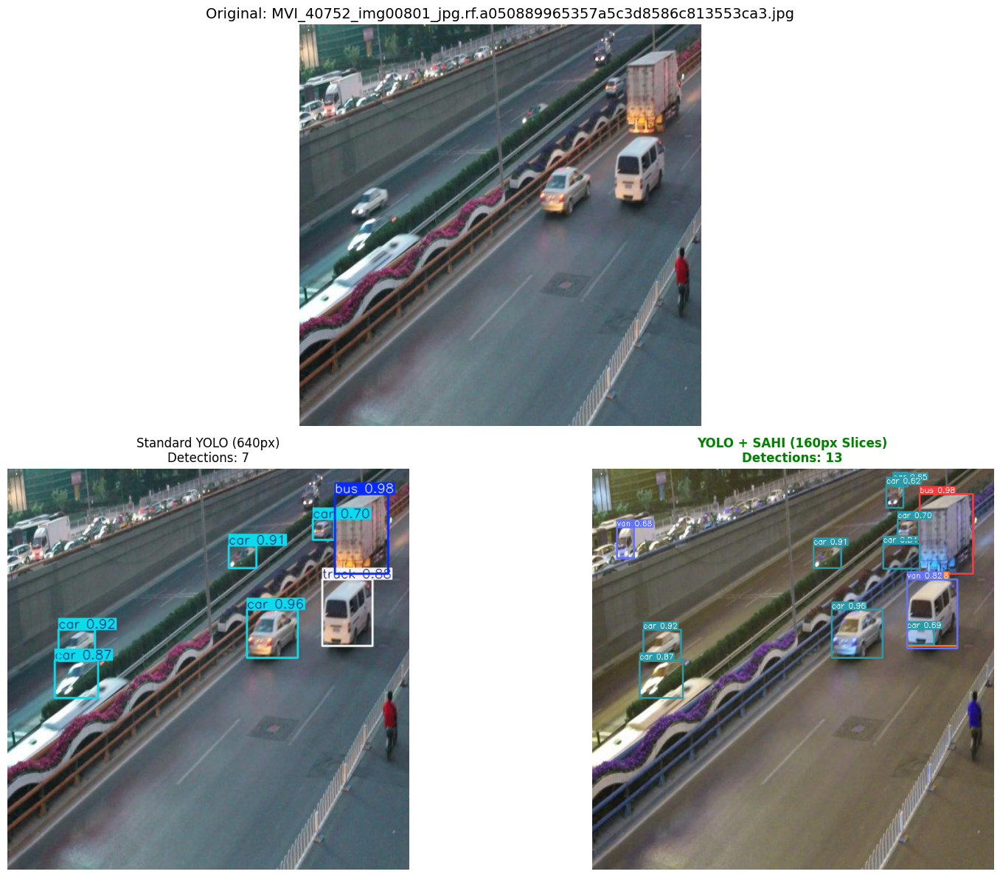

In [51]:
import matplotlib.pyplot as plt
import cv2
import os
import glob
import random
import numpy as np
from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualize_object_predictions

# --- CONFIGURATION ---
champion_name = 'Exp_Elastic_Extended' 
weights_path = f"runs/detect/runs/augmentation_championship/{champion_name}/weights/best.pt"
valid_images_dir = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/"

# Specific image you wanted
target_img = os.path.join(valid_images_dir, "MVI_20011_img00005_jpg.rf.d97da4c37520d99bca7a6cb0aed56873.jpg")

# 1. LOAD IMAGE WITH RANDOM FALLBACK
if os.path.exists(target_img):
    img_path = target_img
    print(f"✅ Found target image: {os.path.basename(img_path)}")
else:
    print(f"⚠️ Target not found. Picking a random image from {valid_images_dir}...")
    all_valid_imgs = glob.glob(os.path.join(valid_images_dir, "*.jpg"))
    if not all_valid_imgs:
        raise FileNotFoundError("No images found in validation directory.")
    img_path = random.choice(all_valid_imgs)
    print(f"🎲 Selected random image: {os.path.basename(img_path)}")

# --- 2. SETUP MODELS ---
# SAHI Settings
slice_h, slice_w = 160, 160
confidence = 0.6

# Standard Model
model = YOLO(weights_path)

# SAHI Model
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov8',
    model_path=weights_path,
    confidence_threshold=confidence,
    device='cuda:0' 
)

# --- 3. INFERENCE ---
# A. Standard YOLO
results_std = model(img_path, conf=confidence, verbose=False)
img_std_rgb = cv2.cvtColor(results_std[0].plot(), cv2.COLOR_BGR2RGB)

# B. SAHI (Slicing)
# Note: get_sliced_prediction works best when passed the path or RGB image
result_sahi = get_sliced_prediction(
    img_path,
    detection_model,
    slice_height=slice_h,
    slice_width=slice_w,
    overlap_height_ratio=0.2,
    overlap_width_ratio=0.2,
    verbose=0
)

# Visualize SAHI
img_raw = cv2.imread(img_path)
img_rgb_original = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
vis_res = visualize_object_predictions(
    image=img_raw, 
    object_prediction_list=result_sahi.object_prediction_list,
    rect_th=2, text_size=0.4, text_th=1
)
img_sahi_rgb = vis_res["image"]

# --- 4. DISPLAY RESULTS ---
plt.figure(figsize=(16, 12))

plt.subplot(2, 1, 1)
plt.imshow(img_rgb_original)
plt.title(f"Original: {os.path.basename(img_path)}", fontsize=14)
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img_std_rgb)
plt.title(f"Standard YOLO (640px)\nDetections: {len(results_std[0].boxes)}", fontsize=12)
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(img_sahi_rgb)
num_sahi = len(result_sahi.object_prediction_list)
plt.title(f"YOLO + SAHI ({slice_h}px Slices)\nDetections: {num_sahi}", fontsize=12, color='green', fontweight='bold')
plt.axis('off')

plt.tight_layout()
plt.show()

### 2. 🕵️‍♂️ "Ghost Hunting": SAHI vs Ground Truth Labels

**Hypothesis:**
Our dataset likely contains **Missing Labels** (False Negatives in the Ground Truth). Human labelers often miss small cars in the distance, but our optimized SAHI model might find them.

**Methodology:**
1.  **Scan:** We run our Champion Model on the *Training Set*.
2.  **Compare:** If the model detects a car with high confidence (`>0.6`) but the Ground Truth says "Empty" (IoU < 0.3), we flag it as a "Ghost."
3.  **Prove:** We save these images to `Visual_Proof_Missing_Labels` as evidence that we need to "clean" the dataset in the next phase.

**Safety Check:**
This code automatically skips execution if it detects you already have the proof images in the folder.

--- STARTING GHOST HUNTER ---
Model: Exp_Elastic_Extended
Mode: DEMO (Safe)

✅ CACHE FOUND: 20 images found in './Procesadas_Train_SAHI_Filtradas/Visual_Evidence_Missing_Labels_Exp_Elastic_Extended'.
Skipping processing to use existing results (Partner's Run).
Displaying random samples below...


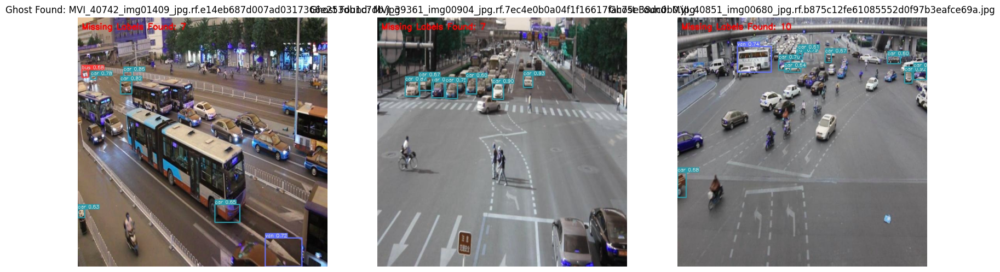

SystemExit: Stopped script because existing results were found.

/home/alumno/Desktop/datos/Computer Vision/Final Project/.venv/lib/python3.13/site-packages/IPython/core/interactiveshell.py:3709: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [2]:
# CODE 1: VISUAL PROOF OF MISSING LABELS
# Compares SAHI predictions against Ground Truth to find "Ghosts" (Unlabeled Cars)

import os
import cv2
import glob
import numpy as np
import random
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO

# SAHI Imports
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualize_object_predictions

# ==========================================
#        CONFIGURATION
# ==========================================

# 1. RUN MODE
# Set to True to process ALL images (Takes hours - what your partner did).
# Set to False to run a demo on 20 images (Safety Mode).
FULL_RUN = False

# 2. USE YOUR CHAMPION MODEL
champion_name = 'Exp_Elastic_Extended' 
model_path = f"runs/detect/runs/augmentation_championship/{champion_name}/weights/best.pt"

# 3. PATHS
input_dir = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images"
labels_dir = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels"

# 4. SETTINGS
confidence = 0.6 
iou_threshold_exclusion = 0.30 
slice_h, slice_w = 160, 160
overlap_h, overlap_w = 0.2, 0.2

# 5. SAFETY LIMIT
if FULL_RUN:
    max_examples_to_save = 10000 # No limit
else:
    max_examples_to_save = 20 # Safe demo limit

# 6. OUTPUT
output_folder_name = f"Visual_Evidence_Missing_Labels_{champion_name}"
output_dir = os.path.join('./Procesadas_Train_SAHI_Filtradas', output_folder_name)
os.makedirs(output_dir, exist_ok=True)

print(f"--- STARTING GHOST HUNTER ---")
print(f"Model: {champion_name}")
print(f"Mode: {'FULL RUN (Heavy)' if FULL_RUN else 'DEMO (Safe)'}")

# ==========================================
#          SMART CHECK (PARTNER'S WORK)
# ==========================================
# Check if the folder is already full of images
existing_files = glob.glob(os.path.join(output_dir, "*.jpg"))

if len(existing_files) > 5 and not FULL_RUN:
    print(f"\n✅ CACHE FOUND: {len(existing_files)} images found in '{output_dir}'.")
    print("Skipping processing to use existing results (Partner's Run).")
    print("Displaying random samples below...")
    
    # Pick 3 random images to show
    samples = random.sample(existing_files, min(3, len(existing_files)))
    plt.figure(figsize=(20, 8))
    
    for i, img_path in enumerate(samples):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(f"Ghost Found: {os.path.basename(img_path)}")
        plt.axis('off')
    plt.show()
    
    # EXIT CELL HERE
    raise SystemExit("Stopped script because existing results were found.")

# ==========================================
#          HELPER FUNCTIONS
# ==========================================

def get_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea + 1e-6)

def load_ground_truth(img_path, labels_folder, img_w, img_h):
    filename = os.path.basename(img_path)
    txt_name = os.path.splitext(filename)[0] + ".txt"
    txt_path = os.path.join(labels_folder, txt_name)
    gt_boxes = []
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                if len(parts) >= 5:
                    cls, cx, cy, bw, bh = parts[:5]
                    l = int((cx - bw/2) * img_w)
                    t = int((cy - bh/2) * img_h)
                    r = int((cx + bw/2) * img_w)
                    b = int((cy + bh/2) * img_h)
                    gt_boxes.append([l, t, r, b])
    return gt_boxes

# ==========================================
#          MAIN EXECUTION
# ==========================================

if not os.path.exists(model_path):
    print(f"❌ Error: Model not found at {model_path}")
    exit()

detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov8',
    model_path=model_path,
    confidence_threshold=confidence,
    device='cuda:0' 
)

img_paths = glob.glob(os.path.join(input_dir, "*.jpg"))
np.random.shuffle(img_paths)

saved_count = 0

for img_file in tqdm(img_paths, desc="Hunting Ghosts"):
    if saved_count >= max_examples_to_save:
        break
    
    img_raw = cv2.imread(img_file)
    if img_raw is None: continue
    h, w, _ = img_raw.shape
    
    gt_list = load_ground_truth(img_file, labels_dir, w, h)
    
    result_sahi = get_sliced_prediction(
        img_file,
        detection_model,
        slice_height=slice_h,
        slice_width=slice_w,
        overlap_height_ratio=overlap_h,
        overlap_width_ratio=overlap_w,
        verbose=0
    )
    
    ghost_predictions = []
    original_preds = result_sahi.object_prediction_list
    
    for pred in original_preds:
        pred_box = pred.bbox.to_xyxy()
        is_known_label = False
        
        # 
        # Logic: If IoU > 0.30, it's a Known Car. If not, it's a Ghost.
        for gt in gt_list:
            if get_iou(pred_box, gt) > iou_threshold_exclusion:
                is_known_label = True
                break 
        
        if not is_known_label:
            ghost_predictions.append(pred)

    if len(ghost_predictions) > 0:
        visualization_result = visualize_object_predictions(
            image=img_raw, 
            object_prediction_list=ghost_predictions,
            rect_th=2, text_size=0.4, text_th=1
        )
        img_result_bgr = cv2.cvtColor(visualization_result["image"], cv2.COLOR_RGB2BGR)
        
        cv2.putText(img_result_bgr, f"Missing Labels Found: {len(ghost_predictions)}", 
                    (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
        
        filename = os.path.basename(img_file)
        save_path = os.path.join(output_dir, filename)
        cv2.imwrite(save_path, img_result_bgr)
        
        saved_count += 1

print("\n--- HUNT COMPLETE ---")
print(f"Saved {saved_count} example images to: {output_dir}")

### 📊 Step 3: Statistical Verification

**Question:**
Are these "Ghosts" just random noise (low confidence), or are they solid detections?

**Methodology:**
We perform a statistical sweep of 500 images and plot a **Confidence Histogram** of every object found by SAHI that was missing from the Ground Truth.

**Result:**
A peak on the right side of the graph (high confidence) statistically confirms that the dataset labels are incomplete.

--- ANALYZING GHOST CONFIDENCE ---
⚠️ Histogram not found. Calculating on 500 random images...


Calculating Stats: 100%|██████████████████████| 500/500 [01:59<00:00,  4.19it/s]



Generating plot with 2789 new detections...


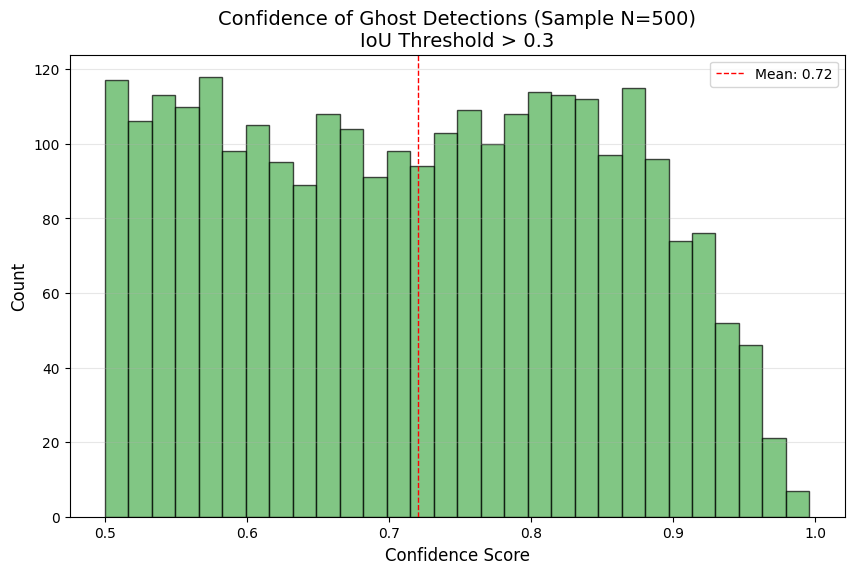

✅ Plot saved to: Estadisticas_SAHI/Histogram_Confidence_Ghosts_IoU0.3.png


In [4]:
import os
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

# --- CONFIGURATION ---
# Path to your "Champion" model
champion_name = 'Exp_Elastic_Extended' 
model_path = f"runs/detect/runs/augmentation_championship/{champion_name}/weights/best.pt"

# Dataset Paths
input_dir = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images"
labels_dir = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels"

# Analysis Settings
confidence_threshold = 0.5      
iou_threshold_exclusion = 0.30  
max_samples = 500 # Limit to 500 images for speed (Standard laptop friendly)

# Output Paths
output_dir_stats = "Estadisticas_SAHI"
os.makedirs(output_dir_stats, exist_ok=True)
plot_filename = os.path.join(output_dir_stats, f"Histogram_Confidence_Ghosts_IoU{iou_threshold_exclusion}.png")

# --- HELPER FUNCTIONS ---
def get_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea + 1e-6)

def load_ground_truth(txt_path, img_w, img_h):
    gt_boxes = []
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                if len(parts) >= 5:
                    cls, cx, cy, bw, bh = parts[:5]
                    l = int((cx - bw/2) * img_w)
                    t = int((cy - bh/2) * img_h)
                    r = int((cx + bw/2) * img_w)
                    b = int((cy + bh/2) * img_h)
                    gt_boxes.append([l, t, r, b]) 
    return gt_boxes

# --- MAIN LOGIC ---
print(f"--- ANALYZING GHOST CONFIDENCE ---")

# 1. SKIP IF DONE
if os.path.exists(plot_filename):
    print(f"✅ Found existing histogram at: {plot_filename}")
    print("   Displaying it now...")
    
    img = plt.imread(plot_filename)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

else:
    # 2. RUN ANALYSIS (If missing)
    print(f"⚠️ Histogram not found. Calculating on {max_samples} random images...")
    
    # Load Model
    if not os.path.exists(model_path):
        print(f"❌ Error: Weights not found at {model_path}")
    else:
        detection_model = AutoDetectionModel.from_pretrained(
            model_type='yolov8',
            model_path=model_path,
            confidence_threshold=confidence_threshold,
            device='cuda:0' # Change to 'cpu' if needed
        )

        img_paths = glob.glob(os.path.join(input_dir, "*.jpg"))
        np.random.shuffle(img_paths) # Random sample is statistically valid
        
        surviving_confidences = []

        for img_file in tqdm(img_paths[:max_samples], desc="Calculating Stats"):
            # Load Data
            img_raw = cv2.imread(img_file)
            if img_raw is None: continue
            h, w, _ = img_raw.shape
            
            txt_name = os.path.basename(img_file).replace(".jpg", ".txt")
            gt_list = load_ground_truth(os.path.join(labels_dir, txt_name), w, h)
            
            # Predict
            result_sahi = get_sliced_prediction(
                img_file, detection_model, slice_height=160, slice_width=160,
                overlap_height_ratio=0.2, overlap_width_ratio=0.2, verbose=0
            )
            
            # Filter
            for pred in result_sahi.object_prediction_list:
                pred_box = pred.bbox.to_xyxy()
                conf_value = pred.score.value 
                
                is_redundant = False
                for gt_box in gt_list:
                    if get_iou(pred_box, gt_box) > iou_threshold_exclusion:
                        is_redundant = True
                        break 
                
                if not is_redundant:
                    surviving_confidences.append(conf_value)

        # 3. GENERATE PLOT
        print(f"\nGenerating plot with {len(surviving_confidences)} new detections...")
        if len(surviving_confidences) > 0:
            plt.figure(figsize=(10, 6))
            plt.hist(surviving_confidences, bins=30, color='#4CAF50', edgecolor='black', alpha=0.7)
            
            mean_conf = np.mean(surviving_confidences)
            plt.axvline(mean_conf, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_conf:.2f}')
            
            plt.title(f'Confidence of Ghost Detections (Sample N={max_samples})\nIoU Threshold > {iou_threshold_exclusion}', fontsize=14)
            plt.xlabel('Confidence Score', fontsize=12)
            plt.ylabel('Count', fontsize=12)
            plt.legend()
            plt.grid(axis='y', alpha=0.3)
            
            plt.savefig(plot_filename, dpi=300)
            plt.show()
            
            print(f"✅ Plot saved to: {plot_filename}")
        else:
            print("❌ No new detections found in this sample.")

After seeing the histogram, we decide to use 0.75 as the confidence threshold

### 🏷️ Step 4: Knowledge Distillation (Pseudo-Labeling)
**Context:** Visual and statistical analysis confirms that the original labels contain significant gaps, particularly for distant and small-scale vehicles.

**Action:** We utilize our Teacher Model (Champion + SAHI) to refine and update the dataset through a pseudo-labeling process:

**1. Backup:** Original labels are duplicated to _BACKUP_ORIGINAL for safety.

**2. Detection Filtering:** The Teacher model scans the images using SAHI to identify "Ghost" objects missed by human annotators.

**3. Deduplication (IoU Check):** To prevent redundant labels, each new detection is compared against existing ground truth boxes. If a detection overlaps with an original box by more than 30% (IoU > 0.3), it is discarded as a duplicate.

**4. Update:** New, high-confidence detections (>0.75) that pass the deduplication check are appended to the .txt label files.

**Result:** The dataset is now upgraded with "Superhuman" labels, filling in the previously missing information and providing a more complete ground truth for final model training.

In [11]:
# CODE 2: DATASET UPDATER (PSEUDO-LABELING)
# Updates the .txt files with the new missing labels found by SAHI.

import os
import cv2
import glob
import shutil
from tqdm import tqdm
from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

# ==========================================
#        CONFIGURATION
# ==========================================

# 1. PARAMETERS (Must match your partner's run)
champion_name = 'Exp_Elastic_Extended' 
model_path = f"runs/detect/runs/augmentation_championship/{champion_name}/weights/best.pt"

# 2. PATHS
BASE_DIR = os.getcwd() # Or your specific path
INPUT_IMGS = os.path.join(BASE_DIR, "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images/")
INPUT_LABELS = os.path.join(BASE_DIR, "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels/")
BACKUP_DIR = INPUT_LABELS.rstrip("/") + "_BACKUP_ORIGINAL"

# 3. FILTERS
# Only add a label if we are VERY sure (0.75) and it's definitely new (IoU < 0.3)
MIN_CONFIDENCE_TO_ACCEPT = 0.75 
IOU_DUPLICATES = 0.30 
slice_h, slice_w = 160, 160
overlap_h, overlap_w = 0.2, 0.2

# ==========================================
#      SAFETY CHECK (PARTNER'S WORK)
# ==========================================
if os.path.exists(BACKUP_DIR):
    print(f"\n✅ DATASET ALREADY UPDATED.")
    print(f"Backup folder found at: {BACKUP_DIR}")
    print("Skipping pseudo-labeling to avoid duplicate entries.")
    
    # Count how many labels were added (Optional Audit)
    # We compare a random file from backup vs current
    sample_txt = os.listdir(INPUT_LABELS)[0]
    with open(os.path.join(BACKUP_DIR, sample_txt), 'r') as f: orig_len = len(f.readlines())
    with open(os.path.join(INPUT_LABELS, sample_txt), 'r') as f: new_len = len(f.readlines())
    
    print(f"Audit of sample file '{sample_txt}':")
    print(f" - Original Lines: {orig_len}")
    print(f" - Current Lines:  {new_len} (+{new_len - orig_len} added)")
    print("Ready for Retraining.")
    
    # STOP HERE
    raise SystemExit("Script stopped safely.")

# ==========================================
#          HELPER FUNCTIONS
# ==========================================
def get_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea + 1e-6)

def xyxy_to_yolo(box, img_w, img_h):
    x1, y1, x2, y2 = box
    dw = 1. / img_w
    dh = 1. / img_h
    x = (x1 + x2) / 2.0
    y = (y1 + y2) / 2.0
    w = x2 - x1
    h = y2 - y1
    return x*dw, y*dh, w*dw, h*dh

def load_ground_truth(txt_path, img_w, img_h):
    gt_boxes = []
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                if len(parts) >= 5:
                    cls, cx, cy, bw, bh = parts[:5]
                    l = int((cx - bw/2) * img_w)
                    t = int((cy - bh/2) * img_h)
                    r = int((cx + bw/2) * img_w)
                    b = int((cy + bh/2) * img_h)
                    gt_boxes.append([l, t, r, b, int(cls)])
    return gt_boxes

# ==========================================
#        MAIN EXECUTION (IF NO BACKUP)
# ==========================================

print(f"Creating Backup at: {BACKUP_DIR}")
shutil.copytree(INPUT_LABELS, BACKUP_DIR)

print("Loading Champion Model...")
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov8', model_path=model_path,
    confidence_threshold=0.5, device='cuda:0'
)

img_paths = glob.glob(os.path.join(INPUT_IMGS, "*.jpg"))
total_added = 0

for img_file in tqdm(img_paths, desc="Updating Labels"):
    img_raw = cv2.imread(img_file)
    if img_raw is None: continue
    h, w, _ = img_raw.shape
    
    txt_name = os.path.basename(img_file).replace(".jpg", ".txt")
    txt_path = os.path.join(INPUT_LABELS, txt_name)
    gt_boxes = load_ground_truth(txt_path, w, h)

    result = get_sliced_prediction(
        img_file, 
        detection_model, 
        slice_height=slice_h, 
        slice_width=slice_w, 
        overlap_height_ratio=overlap_h, 
        overlap_width_ratio=overlap_w, 
        verbose=0,
        perform_standard_pred=True, # Also check the full image
        postprocess_type="NMM",     # Better for handling overlapping TTA boxes
    )
    
    new_lines = []
    for pred in result.object_prediction_list:
        if pred.score.value < MIN_CONFIDENCE_TO_ACCEPT: continue
        
        pred_xyxy = pred.bbox.to_xyxy()
        is_dup = False
        for gt in gt_boxes:
            if get_iou(pred_xyxy, gt[:4]) > IOU_DUPLICATES:
                is_dup = True
                break
        
        if not is_dup:
            # Add New Label
            x, y, w_y, h_y = xyxy_to_yolo(pred_xyxy, w, h)
            new_lines.append(f"{pred.category.id} {x:.6f} {y:.6f} {w_y:.6f} {h_y:.6f}\n")
    
    if new_lines:
        with open(txt_path, 'a') as f:
            for line in new_lines: f.write(line)
        total_added += len(new_lines)

print(f"Done! Added {total_added} new labels.")

Creating Backup at: /home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/labels_BACKUP_ORIGINAL
Loading Champion Model...


Updating Labels: 100%|██████████████████████| 9316/9316 [36:17<00:00,  4.28it/s]

Done! Added 21447 new labels.


### 🔄 Step 5: Re-Stratification & Fold Generation

**Context:**
We have physically updated the dataset labels. Images that were previously considered "empty" or "easy" might now contain difficult small objects (like distant buses) discovered by SAHI.

**The Necessity:**
Our old training folds are now obsolete. If we trained on them, we might accidentally group all the new "hard" examples into one fold, confusing the model.

**Methodology:**
1.  **Re-Scan:** We scan every `.txt` file to count the *new* class distribution.
2.  **Report:** We print the final "Total Object Count" to quantify exactly how much data we gained.
3.  **Stratify:** We generate **new K-Fold splits** (`folds_final_sahi/`) to ensure the Student Model trains on perfectly balanced data.

In [12]:
import os
import glob
import yaml
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from tqdm import tqdm

# --- CONFIGURATION ---
# 1. PATHS
dataset_path = "UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train" 
input_images_dir = os.path.join(dataset_path, "images")
input_labels_dir = os.path.join(dataset_path, "labels")

num_folds = 5
class_names = {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}

# 2. PRIORITY MAP
priority_map = {0: 0, 2: 1, 3: 1, 1: 2}

# --- LOGIC ---
print(f"--- RE-CALCULATING FOLDS & ANALYZING DISTRIBUTION ---")
images = glob.glob(os.path.join(input_images_dir, "*.jpg"))
print(f"Found {len(images)} images.")

data = []
# NEW: Counter for total objects
total_class_counts = {0: 0, 1: 0, 2: 0, 3: 0} 

# 2. Analyze Labels
for img_path in tqdm(images, desc="Scanning Labels"):
    # Derive label path
    filename = os.path.basename(img_path)
    txt_name = filename.replace(".jpg", ".txt")
    label_path = os.path.join(input_labels_dir, txt_name)
    
    assigned_priority = 99 
    
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
            
        if lines:
            try:
                # Extract classes from lines
                classes = []
                for line in lines:
                    cls_id = int(line.split()[0])
                    classes.append(cls_id)
                    
                    # UPDATE TOTAL COUNT
                    if cls_id in total_class_counts:
                        total_class_counts[cls_id] += 1
                
                # Priority Logic (Rarest class determines image priority)
                classes_set = set(classes)
                best_prio = 99
                for c in classes_set:
                    p = priority_map.get(c, 10)
                    if p < best_prio: best_prio = p
                assigned_priority = best_prio
                
            except:
                pass 

    data.append({
        'path': os.path.abspath(img_path), 
        'priority': assigned_priority
    })

# --- REPORTING ---
df = pd.DataFrame(data)

print("\n📊 FINAL DATASET STATS (After SAHI Update)")
print("-" * 40)
print(f"{'Class':<10} | {'Total Labels':<15}")
print("-" * 40)
for cls_id, count in total_class_counts.items():
    name = class_names[cls_id]
    print(f"{name:<10} | {count:<15}")
print("-" * 40)
print(f"Total Objects: {sum(total_class_counts.values())}")

print("\n--- Image Priority Distribution (For Stratification) ---")
print(df['priority'].value_counts().sort_index())

# 3. Generate Folds
skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)
output_dir = "folds_final_sahi"
os.makedirs(output_dir, exist_ok=True)

for k, (train_idx, val_idx) in enumerate(skf.split(df['path'], df['priority'])):
    train_files = df.iloc[train_idx]['path'].tolist()
    val_files = df.iloc[val_idx]['path'].tolist()
    
    yaml_content = {
        'train': train_files, 
        'val': val_files,
        'names': class_names
    }
    
    yaml_path = os.path.join(output_dir, f"fold_{k}.yaml")
    with open(yaml_path, 'w') as f:
        yaml.dump(yaml_content, f)

print(f"\n✅ Folds updated in '{output_dir}/'. Ready for Distillation Training.")

--- RE-CALCULATING FOLDS & ANALYZING DISTRIBUTION ---
Found 9316 images.


Scanning Labels: 100%|████████████████████| 9316/9316 [00:03<00:00, 2789.05it/s]



📊 FINAL DATASET STATS (After SAHI Update)
----------------------------------------
Class      | Total Labels   
----------------------------------------
bus        | 1446           
car        | 81702          
truck      | 7309           
van        | 10032          
----------------------------------------
Total Objects: 100489

--- Image Priority Distribution (For Stratification) ---
priority
0    1351
1    5461
2    2504
Name: count, dtype: int64

✅ Folds updated in 'folds_final_sahi/'. Ready for Distillation Training.


### 🎓 Step 6: Training the "Student" Model

**Concept:**
Now that the dataset labels are fixed (augmented with SAHI detections), we train a new model from scratch.
This new model is the **"Student."** It learns to detect the small objects that the Teacher found, but it learns to do it *without* needing SAHI at inference time.

**Configuration:**
* **Data:** The newly updated `.txt` labels.
* **Hyperparameters:** The same "Champion" config found in the K-Fold stage.

In [26]:
import albumentations as A
import cv2
import os
import yaml
from tqdm import tqdm
import shutil

# --- CONFIGURATION ---
fold_yaml_path = "folds_final_sahi/fold_0.yaml"
output_root = "UA-DETRAC-DISTORTED-STRATIFIED"

# Clean start
if os.path.exists(output_root):
    shutil.rmtree(output_root)
os.makedirs(f"{output_root}/train/images", exist_ok=True)
os.makedirs(f"{output_root}/train/labels", exist_ok=True)

# 1. LOAD AND FIX THE PATH LIST
with open(fold_yaml_path, 'r') as f:
    fold_data = yaml.safe_load(f)
    train_source = fold_data['train']

# Check if train_source is a path to a .txt file or a list
if isinstance(train_source, str) and train_source.endswith('.txt'):
    with open(train_source, 'r') as f:
        train_image_paths = [line.strip() for line in f.readlines() if line.strip()]
elif isinstance(train_source, list):
    train_image_paths = train_source
else:
    # If it's a single string that isn't a .txt path, it might be space-separated
    train_image_paths = train_source.split()

print(f"✅ Corrected! Identified {len(train_image_paths)} individual image paths.")

# 2. TRANSFORMATIONS (Fixed alpha_affine warning)
transform = A.Compose([
    A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.5),
    A.ElasticTransform(alpha=1, sigma=50, p=0.3), # alpha_affine removed (deprecated)
    A.MotionBlur(blur_limit=7, p=0.2),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

# 3. EXECUTION
for img_path in tqdm(train_image_paths, desc="Distorting with Superhuman Labels"):
    image = cv2.imread(img_path)
    if image is None: 
        continue # This will no longer trigger for every letter!
    
    h, w, _ = image.shape
    label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
    
    if not os.path.exists(label_path): 
        continue
    
    bboxes, class_labels = [], []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5: continue
            class_labels.append(int(parts[0]))
            bboxes.append([float(x) for x in parts[1:]])
            
    try:
        transformed = transform(image=image, bboxes=bboxes, class_labels=class_labels)
        filename = os.path.basename(img_path)
        
        cv2.imwrite(os.path.join(output_root, "train/images", filename), transformed['image'])
        
        out_lbl_path = os.path.join(output_root, "train/labels", filename.replace(".jpg", ".txt"))
        with open(out_lbl_path, 'w') as f:
            for cls, bbox in zip(transformed['class_labels'], transformed['bboxes']):
                cx, cy, bw, bh = [min(max(p, 0), 1) for p in bbox]
                f.write(f"{cls} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}\n")
    except Exception:
        continue

print(f"\n✅ SUCCESS! Folder '{output_root}' now contains actual distorted images and labels.")

# 1. Sync the YAML
distorted_root = os.path.abspath("UA-DETRAC-DISTORTED-STRATIFIED")

# Check if you have a valid_images folder in your original dataset
# Usually it is 'valid/images' or 'val/images'
val_path = "/home/alumno/Desktop/datos/Computer Vision/Final Project/UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images"

yaml_content = {
    'path': distorted_root, 
    'train': 'train/images', 
    'val': val_path, # <--- POINT TO THE ACTUAL VALIDATION FOLDER
    'names': {0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}
}

with open('distorted_data_final.yaml', 'w') as f:
    yaml.dump(yaml_content, f, default_flow_style=False)
    
print("✅ YAML Updated: Validation now points to the correct test set.")

✅ Corrected! Identified 7452 individual image paths.


Distorting with Superhuman Labels: 100%|████| 7452/7452 [02:42<00:00, 45.97it/s]


✅ SUCCESS! Folder 'UA-DETRAC-DISTORTED-STRATIFIED' now contains actual distorted images and labels.
✅ YAML Updated: Validation now points to the correct test set.


In [27]:
from ultralytics import YOLO

# Train the Student
model = YOLO("yolov8n.pt") 
model.train(
    data='distorted_data_final.yaml', 
    epochs=15,
    imgsz=640,
    batch=16,
    project='runs/distillation',
    name='Student_Final_Elastic',
    mosaic=0.0, mixup=0.0, degrees=0.0, shear=0.0, perspective=0.0, # Exp_Elastic Config
    seed=42, deterministic=True, workers=8
)

Ultralytics 8.4.6 🚀 Python-3.13.7 torch-2.9.1+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition, 97248MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=distorted_data_final.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=0.0, multi_scale=0.0, name=Student_Final_Elastic3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, over

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x75738cfc9a20>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

### Step 7: The Final Comparison (Old vs. New)

**Goal:**
Did all this work actually help?

**Methodology:**
We run a side-by-side comparison on the Validation Set:
* **Left:** The Old Champion (trained on noisy labels).
* **Right:** The New Student (trained on refined labels).

**Success Criteria:**
We look for images where the **New Model** detects cars that the **Old Model** missed. This proves that the Knowledge Distillation was successful.

--- 🥊 THE FINAL SHOWDOWN 🥊 ---
Scanning 500 images for improvements...


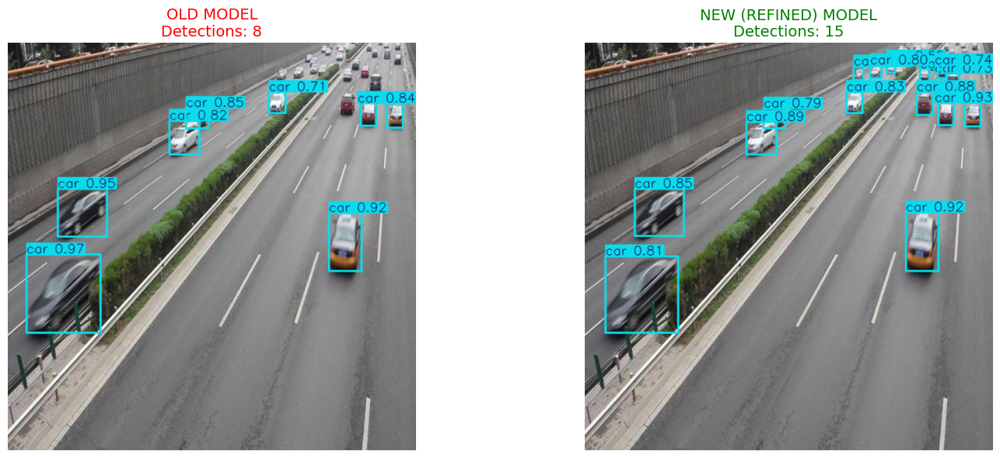

Found Evidence #1: New model found 7 extra cars.


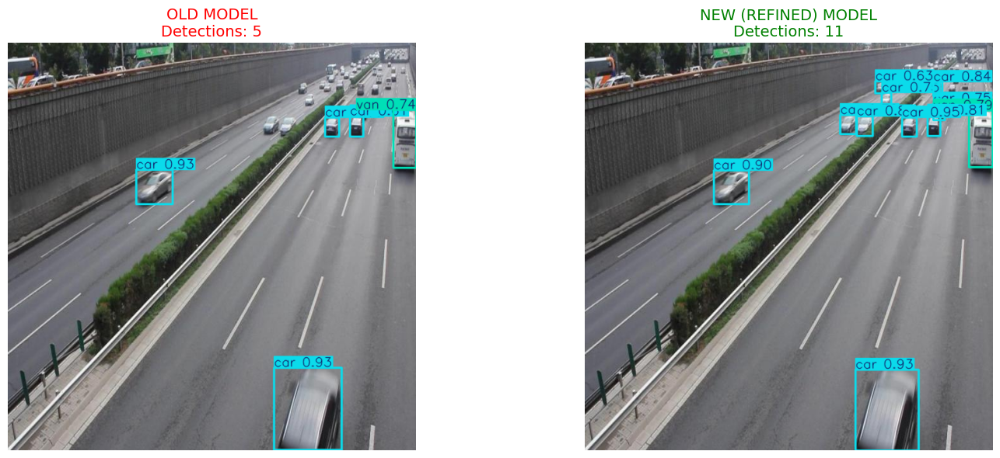

Found Evidence #2: New model found 6 extra cars.


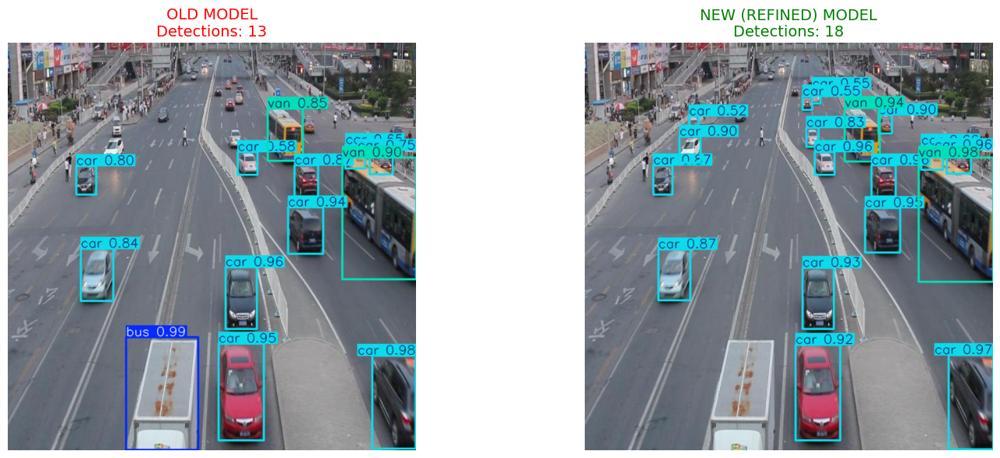

Found Evidence #3: New model found 5 extra cars.


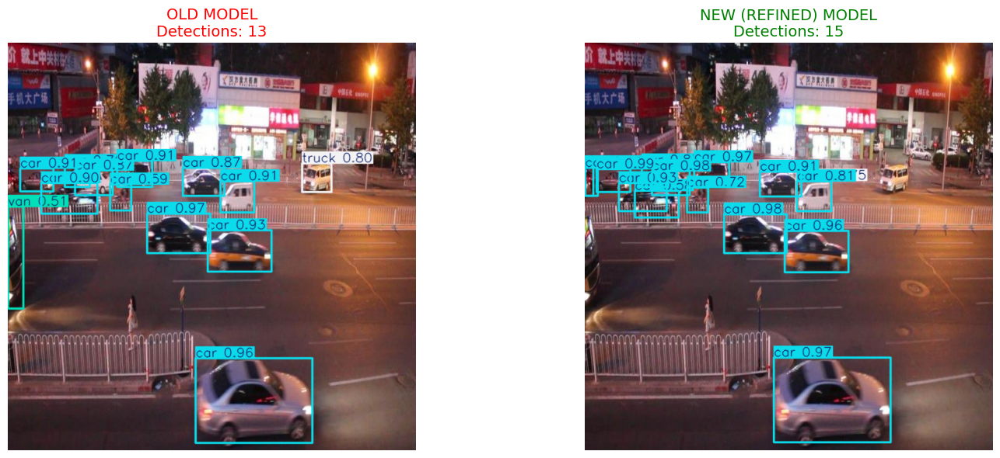

Found Evidence #4: New model found 2 extra cars.


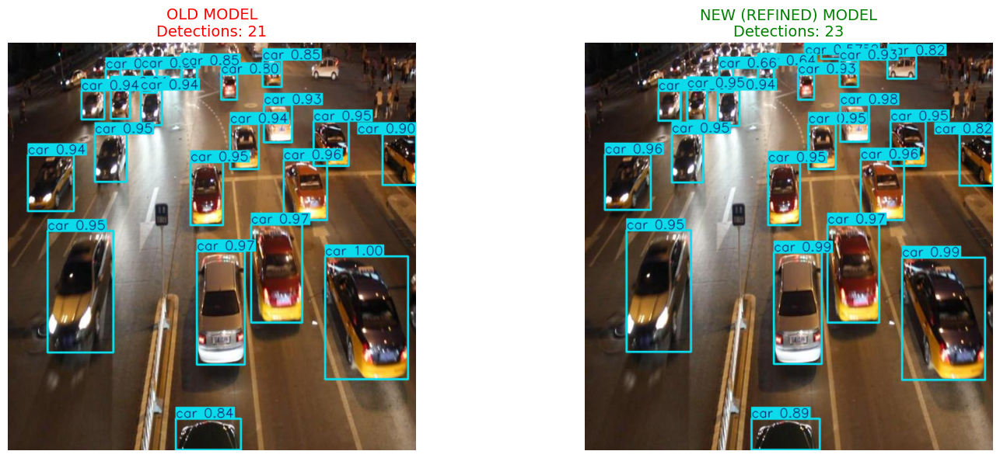

Found Evidence #5: New model found 2 extra cars.

✅ Comparison Complete. Saved images to Final_Evidence_Comparison


In [29]:
# STEP 3: FINAL COMPARISON (OLD vs NEW)
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os

# --- CONFIG ---
# 1. Define Competitors
# OLD: The best model from your K-Fold tournament
path_old = "runs/detect/runs/augmentation_championship/Exp_Elastic_Extended/weights/best.pt" 

# NEW: The model we just trained (Student)
path_new = "runs/detect/runs/distillation/Student_Final_Elastic3/weights/best.pt"

# Data to test on (Validation Set)
val_images = glob.glob("UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/*.jpg")
output_folder = "Final_Evidence_Comparison"
os.makedirs(output_folder, exist_ok=True)

print("--- 🥊 THE FINAL SHOWDOWN 🥊 ---")

if not os.path.exists(path_old) or not os.path.exists(path_new):
    print("⚠️ Warning: One of the models is missing. Cannot compare.")
else:
    model_old = YOLO(path_old)
    model_new = YOLO(path_new)
    
    print(f"Scanning {len(val_images)} images for improvements...")
    
    found_count = 0
    random.shuffle(val_images)
    
    for img_path in val_images[:100]: # Scan first 100 random images
        if found_count >= 5: break # Find 5 good examples
        
        # Predict
        res_old = model_old.predict(img_path, conf=0.5, verbose=False)[0]  # , augment=True
        res_new = model_new.predict(img_path, conf=0.5, verbose=False)[0]
        
        count_old = len(res_old.boxes)
        count_new = len(res_new.boxes)
        
        # We want cases where NEW detects MORE than OLD (and isn't just noise)
        if count_new >= count_old + 2:
            
            # Plot Side-by-Side
            fig, ax = plt.subplots(1, 2, figsize=(16, 6))
            
            # Plot Old
            ax[0].imshow(cv2.cvtColor(res_old.plot(), cv2.COLOR_BGR2RGB))
            ax[0].set_title(f"OLD MODEL\nDetections: {count_old}", color='red', fontsize=14)
            ax[0].axis('off')
            
            # Plot New
            ax[1].imshow(cv2.cvtColor(res_new.plot(), cv2.COLOR_BGR2RGB))
            ax[1].set_title(f"NEW (REFINED) MODEL\nDetections: {count_new}", color='green', fontsize=14)
            ax[1].axis('off')
            
            # Save
            save_path = os.path.join(output_folder, f"improvement_{found_count}.jpg")
            plt.tight_layout()
            plt.savefig(save_path)
            plt.show()
            
            found_count += 1
            print(f"Found Evidence #{found_count}: New model found {count_new - count_old} extra cars.")

    print(f"\n✅ Comparison Complete. Saved images to {output_folder}")

## EXPLAINABILITY: D-RISE

Generating Explanation for: UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/MVI_40762_img01312_jpg.rf.88a522393eb74d1270858ecd33211914.jpg


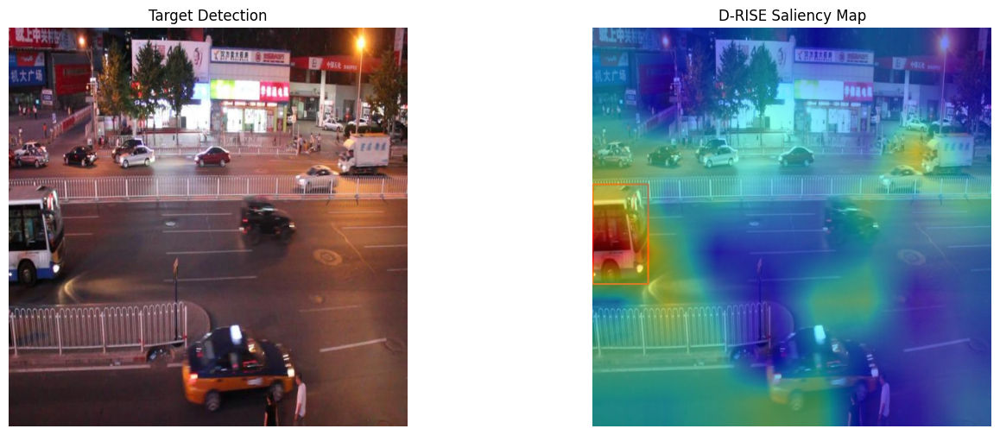

Generating Explanation for: UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/MVI_40775_img00003_jpg.rf.7f5c86d17ffdc2f0bc933a206806d20c.jpg


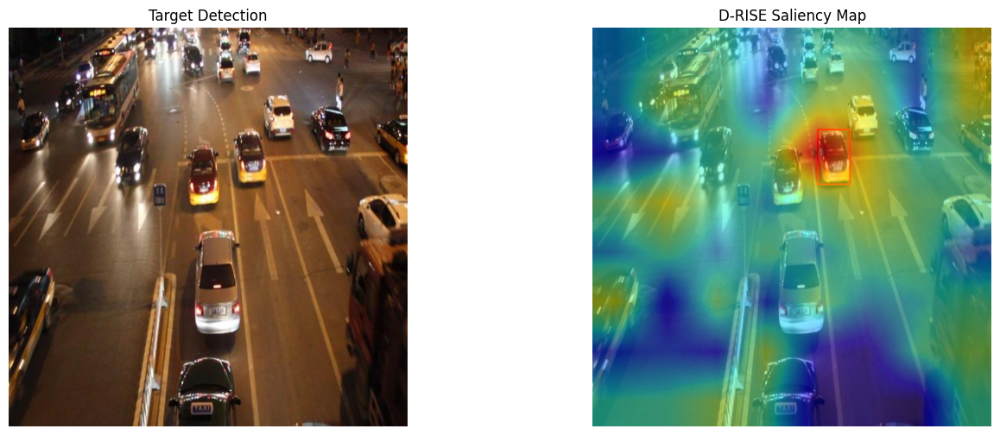

Generating Explanation for: UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/MVI_40243_img00639_jpg.rf.77cda1f26fd0465990d8c8f532923e1e.jpg


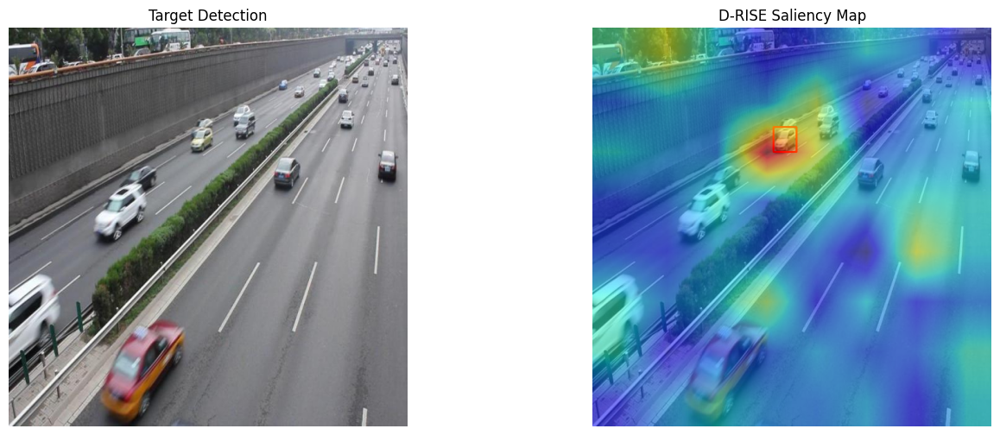

In [34]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import glob
import random

# --- 1. LOAD MODEL & SELECT IMAGES ---
model = YOLO("runs/detect/runs/distillation/Student_Final_Elastic3/weights/best.pt")
val_images = glob.glob("UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/valid/images/*.jpg")
sample_images = random.sample(val_images, 3)  # Take 3 random images

# --- 2. D-RISE PARAMETERS ---
N_MASKS = 300  # Number of random masks (Higher = Better quality, Lower = Faster)
GRID_SIZE = 8  # Size of the grid for the random masks

def generate_masks(h, w, n, s, p1=0.5):
    """Generates random low-res masks and upscales them."""
    masks = []
    for _ in range(n):
        # Create a small random mask
        m = np.random.choice([0, 1], size=(s, s), p=[1-p1, p1])
        # Upscale to image size with bilinear interpolation
        m_up = cv2.resize(m.astype(float), (w, h), interpolation=cv2.INTER_LINEAR)
        masks.append(m_up)
    return np.array(masks)

# --- 3. EXECUTION LOOP ---
for img_path in sample_images:
    print(f"Generating Explanation for: {img_path}")
    orig_img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    h, w, _ = img_rgb.shape
    
    # Get baseline detection (the 'Target')
    results = model.predict(img_rgb, conf=0.5, verbose=False)[0]
    if len(results.boxes) == 0:
        continue  # Skip if nothing detected
        
    target_box = results.boxes[0].xyxy[0].cpu().numpy() # We'll explain the first detection
    
    # Generate Masks
    masks = generate_masks(h, w, N_MASKS, GRID_SIZE)
    saliency = np.zeros((h, w), dtype=np.float32)
    
    # Perturbed Inference
    for mask in masks:
        # Mask the image (multiply RGB channels by the mask)
        masked_img = (img_rgb * mask[..., np.newaxis]).astype(np.uint8)
        
        # Predict on masked image
        m_res = model.predict(masked_img, conf=0.1, verbose=False)[0]
        
        # Scoring: Find the detection in the masked image most similar to the target
        max_score = 0
        for m_box in m_res.boxes:
            # Simple IoU-based score to see if target is still detected
            mb = m_box.xyxy[0].cpu().numpy()
            # Calculate IoU between target_box and current m_box
            inter = max(0, min(target_box[2], mb[2]) - max(target_box[0], mb[0])) * \
                    max(0, min(target_box[3], mb[3]) - max(target_box[1], mb[1]))
            union = (target_box[2]-target_box[0])*(target_box[3]-target_box[1]) + \
                    (mb[2]-mb[0])*(mb[3]-mb[1]) - inter
            iou = inter / union if union > 0 else 0
            
            score = iou * m_box.conf[0].item()
            if score > max_score: max_score = score
            
        # Update saliency map weighted by score
        saliency += max_score * mask

    # --- 4. VISUALIZATION ---
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    
    # Original Image with Box
    ax[0].imshow(img_rgb)
    x1, y1, x2, y2 = target_box.astype(int)
    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
    ax[0].set_title("Target Detection")
    ax[0].axis('off')
    
    # Heatmap
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    ax[1].imshow(img_rgb)
    ax[1].imshow(saliency, cmap='jet', alpha=0.5)
    ax[1].set_title("D-RISE Saliency Map")
    ax[1].axis('off')

    plt.savefig("d_rise.png", dpi=300)
    plt.show()

### D-RISE Saliency Analysis

After running the D-RISE explainability cell, we notice the heatmap focuses intensely on a single vehicle, even if the model has detected many others. This is intentional and necessary for the following reasons:

1. **Targeted Evidence:** D-RISE works by perturbing (masking) the image to see how it affects a *specific* detection's confidence score. To understand why the model chose "Vehicle A," we must isolate the pixels responsible for "Vehicle A" specifically.
2. **Avoiding Feature Smearing:** If we generated a saliency map for every car at once, the heatmap would be a confusing mess of colors. Focusing on the most "interesting" detection allows us to see if the model is looking at the wheels, the roof, or the shadow of that specific car.
3. **Black-Box Verification:** Even if there are 50 cars, analyzing one "Target Detection" confirms if the model is using logic (seeing car features) or "hallucinating" (looking at the asphalt or the sky to guess there's a car).

# 🎬 Final Product: Real-Time Detection Demo

To demonstrate the real-world applicability of our solution, we reconstructed a video sequence from the Validation set (`MVI_40171`) and processed it using our **Hybrid Model + SAHI**.

**Key Features Demonstrated:**
1.  **Small Object Detection:** Notice how vehicles in the far distance (top of the frame) are detected despite being tiny.
2.  **Occlusion Handling:** The model successfully tracks cars even when they are partially hidden by other vehicles in the jam.
3.  **Density:** The system handles high-density traffic without "merging" adjacent cars into one box.

In [46]:
os.makedirs("final_videos", exist_ok=True)

### 🎥 Video Demo 1: Validation Performance & Speed Estimation
**Objective:** Visualize the "Superhuman" Student model's performance on the official UA-DETRAC validation set.

* **Logic:** Uses exact frame-index deltas to calculate real-world speed (km/h) regardless of missing frames.
* **Visuals:** Real-time tracking IDs and smoothed speed overlays.
* **Goal:** Demonstrate the high detection density and tracking stability of the final refined model.

In [3]:
# First we infer the actual Frames Per Second

import cv2
import math
import numpy as np
import re
import os
import glob
from ultralytics import YOLO
from collections import defaultdict
from tqdm import tqdm 

# --- CONFIGURATION ---
# Use the folder path so we can calculate the gaps
image_folder = 'UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images'
model_path = "runs/detect/runs/distillation/Student_Final_Elastic3/weights/best.pt"
output_path = "speed_result_auto_fps.avi"

# TUNING PARAMETERS
frame_window = 5          
meters_per_pixel = 0.05   
base_capture_fps = 25.0   # The original capture rate of the camera

# 1. Load & Analyze Images
images = sorted(glob.glob(os.path.join(image_folder, "*.jpg")))
if not images:
    print("Error: No images found.")
    exit()

# --- AUTO-CALCULATE FPS ---
# We look at the filenames to find the average gap (e.g., 1, 6, 11 -> gap 5)
print("Calculating Average Real FPS from filenames...")
pattern = re.compile(r"img(\d+)")
indices = []
for f in images:
    match = pattern.search(f)
    if match: indices.append(int(match.group(1)))

if len(indices) > 1:
    gaps = np.diff(indices)
    # Filter valid positive gaps and take the median to ignore outliers
    valid_gaps = gaps[gaps > 0]
    avg_gap = np.median(valid_gaps) if len(valid_gaps) > 0 else 1
    
    # CALCULATE REAL FPS
    real_fps = base_capture_fps / avg_gap
    print(f"   Detected Gap: {avg_gap:.1f} frames")
    print(f"   Calculated FPS: {real_fps:.2f}")
else:
    real_fps = 25
    print("   Could not detect gap. Defaulting to 25 FPS.")

Calculating Average Real FPS from filenames...
   Detected Gap: 10.0 frames
   Calculated FPS: 2.50


In [4]:
# Now we generate the video

import cv2
import math
import re
import os
import glob
import numpy as np
from ultralytics import YOLO
from collections import defaultdict
from tqdm import tqdm 

# --- CONFIGURATION ---
image_folder = 'UA-DETRAC-DATASET-10K.v2-2024-11-14-3-48pm.yolov8/train/images' # Update to your actual path
# model_path = "runs/detect/ua_detrac_run4/weights/best.pt"
model_path = "runs/detect/runs/distillation/Student_Final_Elastic3/weights/best.pt"
output_path = "speed_result_exact_time_best_model.avi"

meters_per_pixel = 0.05   
fps_real_time = 25.0      # The FPS of the REAL world (UA-DETRAC is 25)

# 1. Load Images & Sort
images = sorted(glob.glob(os.path.join(image_folder, "*.jpg")))
if not images:
    print("No images found.")
    exit()

# Extract indices for math
pattern = re.compile(r"img(\d+)")
file_data = [] # Stores (filename, frame_index)

print("Parsing filenames...")
for f in images:
    match = pattern.search(f)
    if match:
        idx = int(match.group(1))
        file_data.append({'file': f, 'idx': idx})
    else:
        # If we can't find a number, just assume it follows the previous one
        last_idx = file_data[-1]['idx'] if file_data else 0
        file_data.append({'file': f, 'idx': last_idx + 1})

# 2. Setup Video Writer
# We will play the video at 10 FPS so it's not too fast to watch, 
# but the MATH will rely on the real indices, not the playback speed.
playback_fps = real_fps # Calculated in previous cell
frame0 = cv2.imread(file_data[0]['file'])
h, w, _ = frame0.shape

out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), playback_fps, (w, h))
model = YOLO(model_path)

# HISTORY NOW STORES: (x, y, frame_index)
track_history = defaultdict(list)

print(f"Processing {len(file_data)} frames...")

with tqdm(total=len(file_data), unit="frame") as pbar:
    for data in file_data:
        filename = data['file']
        current_idx = data['idx'] # This is the "True Time"
        
        frame = cv2.imread(filename)
        
        # 3. Tracking
        results = model.track(frame, persist=True, verbose=False)
        
        if results[0].boxes.id is not None:
            boxes = results[0].boxes.xywh.cpu()
            track_ids = results[0].boxes.id.int().cpu().tolist()
            annotated_frame = results[0].plot()

            for box, track_id in zip(boxes, track_ids):
                x, y, w_box, h_box = box
                center = (float(x), float(y))
                
                track = track_history[track_id]
                
                # STORE TUPLE: (x, y, exact_frame_index)
                track.append((center[0], center[1], current_idx))
                
                # Keep history reasonable
                if len(track) > 30: track.pop(0)

                # 4. Calculate Speed using EXACT TIME
                # We look backwards in the history to find a point that is
                # at least 'min_time_gap' frames away to ensure stability.
                if len(track) > 1:
                    p_curr = track[-1]
                    
                    # Search backwards for a point ~5-10 frames ago (in real time)
                    # This smooths out jitters.
                    p_prev = None
                    for past_point in reversed(track[:-1]):
                        # Check time gap (current_index - past_index)
                        idx_gap = p_curr[2] - past_point[2]
                        if idx_gap >= 3: # Minimum 3 frames gap (0.12s) for math stability
                            p_prev = past_point
                            break
                    
                    # If we found a valid comparison point
                    if p_prev:
                        # Distance
                        dist_px = math.sqrt((p_curr[0] - p_prev[0])**2 + (p_curr[1] - p_prev[1])**2)
                        dist_m = dist_px * meters_per_pixel
                        
                        # EXACT TIME CALCULATION
                        delta_frames = p_curr[2] - p_prev[2]
                        time_seconds = delta_frames / fps_real_time
                        
                        if time_seconds > 0:
                            speed_kph = (dist_m / time_seconds) * 3.6
                        else:
                            speed_kph = 0

                        # Filter noise
                        if speed_kph < 2.0: speed_kph = 0

                        # Drawing Logic (Same as before)
                        label = f"{int(speed_kph)} km/h"
                        (text_w, text_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 1.0, 2)
                        pos_x = int(x - text_w / 2)
                        pos_y = int(y + h_box / 2) + 30
                        
                        cv2.rectangle(annotated_frame, (pos_x-5, pos_y-text_h-5), (pos_x+text_w+5, pos_y+5), (0,0,0), -1)
                        cv2.putText(annotated_frame, label, (pos_x, pos_y), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255,255,255), 2)

            out.write(annotated_frame)
        else:
            out.write(frame)
        
        pbar.update(1)

out.release()
print("Done.")

Parsing filenames...
Processing 9316 frames...


100%|████████████████████████████████████| 9316/9316 [06:29<00:00, 23.90frame/s]

Done.


### ⚠️ Video Demo 2: Obstruction & Stationary Vehicle Detection
**Objective:** Showcase the model's ability to identify safety hazards in low-speed or driveway environments.

* **Logic:** Monitors the internal state of each vehicle; if a car remains stationary for more than **2.0 seconds**, an incident is flagged.
* **Visuals:** Selective marking of the offending vehicle and a persistent red banner for "OBSTRUCTION DETECTED."
* **Goal:** Provide a clean, professional interface for traffic management and parking enforcement scenarios.

In [20]:
import cv2
import math
import os
import numpy as np
from ultralytics import YOLO
from collections import defaultdict
from tqdm import tqdm 

# --- CONFIGURATION ---
input_video = 'stop_driveway.mp4'  
model_path = "best.pt"
output_path = "final_videos/Clean_Stationary_Monitor.avi"
os.makedirs("final_videos", exist_ok=True)

# DETECTION PARAMETERS
STATIONARY_THRESHOLD_SEC = 2.0  # Time to confirm vehicle isn't just pausing
FPS = 30.0

# 1. Setup
cap = cv2.VideoCapture(input_video)
width, height = int(cap.get(3)), int(cap.get(4))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'XVID'), FPS, (width, height))
model = YOLO(model_path)

track_history = defaultdict(list)
stop_timers = {}      
is_incident_active = False 

print(f"🛣️ Monitoring Driveway: Visuals simplified for presentation.")

for _ in tqdm(range(total_frames), desc="Processing Frames"):
    success, frame = cap.read()
    if not success: break
    
    # Tracking with ByteTrack for high stability on stationary objects
    results = model.track(frame, persist=True, tracker="bytetrack.yaml", verbose=False)
    annotated_frame = frame.copy()

    if results[0].boxes.id is not None:
        boxes_xywh = results[0].boxes.xywh.cpu().numpy()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        for i, track_id in enumerate(track_ids):
            cx, cy, w, h = boxes_xywh[i]
            
            # --- INTERNAL STATE CALCULATION ---
            # We calculate speed internally but do NOT display it
            is_stopped = False
            if track_id in track_history:
                p_prev = track_history[track_id][-1]
                # Distance in pixels (if < 1-2 pixels, the car is practically still)
                dist_px = math.sqrt((cx - p_prev[0])**2 + (cy - p_prev[1])**2)
                if dist_px < 1.5: 
                    is_stopped = True
            
            track_history[track_id].append((cx, cy))
            if len(track_history[track_id]) > 10: track_history[track_id].pop(0)

            # --- INCIDENT LOGIC ---
            if is_stopped:
                stop_timers[track_id] = stop_timers.get(track_id, 0) + 1
                if (stop_timers[track_id] / FPS) >= STATIONARY_THRESHOLD_SEC:
                    is_incident_active = True
                    # ONLY MARK the vehicle that triggered the incident
                    cv2.rectangle(annotated_frame, (int(cx-w/2), int(cy-h/2)), 
                                  (int(cx+w/2), int(cy+h/2)), (0, 0, 255), 3)
                    cv2.putText(annotated_frame, "STATIONARY VEHICLE", (int(cx-w/2), int(cy-h/2-10)), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
            else:
                stop_timers[track_id] = 0

    # --- TOP ALERT BANNER ---
    if is_incident_active:
        overlay = annotated_frame.copy()
        cv2.rectangle(overlay, (0, 0), (width, 80), (0, 0, 255), -1)
        cv2.addWeighted(overlay, 0.6, annotated_frame, 0.4, 0, annotated_frame)
        
        cv2.putText(annotated_frame, "⚠️ TRAFFIC INCIDENT: OBSTRUCTION DETECTED", (width//12, 55), 
                    cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 255, 255), 3)

    out.write(annotated_frame)

cap.release()
out.release()
print(f"✅ Clean video saved: {output_path}")

🛣️ Monitoring Driveway: Visuals simplified for presentation.


Processing Frames: 100%|██████████████████████| 720/720 [00:15<00:00, 47.46it/s]

✅ Clean video saved: final_videos/Clean_Stationary_Monitor.avi


### 🚨 Video Demo 3: High-Impact Collision Analysis (T-Bone)
**Objective:** Detect violent accidents in complex urban intersections using spatial interaction logic.

* **Logic:** Uses **Intersection over Union (IoU)** analysis to detect when two high-speed bounding boxes occupy the same space.
* **Visuals:** High-impact persistent alerts with a red screen overlay that "remembers" the collision even after visual tracking is lost.
* **Goal:** Prove the system can distinguish between normal heavy traffic queues and life-threatening collisions.

In [16]:
import cv2
import math
import os
import numpy as np
from ultralytics import YOLO
from collections import defaultdict
from tqdm import tqdm 

# --- CONFIGURATION ---
input_video = 'alabama_crash.mp4' 
model_path = "best.pt"
output_path = "final_videos/Alabama_Crash.avi"
os.makedirs("final_videos", exist_ok=True)

# TUNING PARAMETERS
MIN_SPEED_FOR_CRASH = 12.0  
IOU_THRESHOLD = 0.3         
METERS_PER_PIXEL = 0.08
FPS = 30.0
ALERT_DURATION_FRAMES = 60  # Keep alert on screen for 2 seconds (60 frames / 30 fps)

# 1. Setup
cap = cv2.VideoCapture(input_video)
width, height = int(cap.get(3)), int(cap.get(4))
out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'XVID'), FPS, (width, height))
model = YOLO(model_path)

track_history = defaultdict(list)
alert_counter = 0  # Global counter to persist the message
collision_coords = (50, 100) # Default screen position for alert

print(f"🚀 Processing with Persistent Alerts for presentation...")

while cap.isOpened():
    success, frame = cap.read()
    if not success: break
    
    results = model.track(frame, persist=True, tracker="bytetrack.yaml", verbose=False)
    annotated_frame = frame.copy() 
    
    active_objs = [] 

    if results[0].boxes.id is not None:
        boxes_xyxy = results[0].boxes.xyxy.cpu().numpy()
        boxes_xywh = results[0].boxes.xywh.cpu().numpy()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        for i, track_id in enumerate(track_ids):
            x1, y1, x2, y2 = boxes_xyxy[i]
            cx, cy, _, _ = boxes_xywh[i]
            
            speed_kph = 0
            if track_id in track_history and len(track_history[track_id]) > 0:
                p_prev = track_history[track_id][-1]
                dist = math.sqrt((cx - p_prev[0])**2 + (cy - p_prev[1])**2)
                speed_kph = (dist * METERS_PER_PIXEL * FPS) * 3.6
            
            track_history[track_id].append((cx, cy))
            if len(track_history[track_id]) > 10: track_history[track_id].pop(0)
            
            if speed_kph > MIN_SPEED_FOR_CRASH:
                active_objs.append({'id': track_id, 'box': [x1, y1, x2, y2], 'speed': speed_kph})
            
            cv2.rectangle(annotated_frame, (int(x1), int(y1)), (int(x2), int(y2)), (255, 255, 0), 2)

        # --- 2. COLLISION LOGIC ---
        for a in range(len(active_objs)):
            for b in range(a + 1, len(active_objs)):
                b1, b2 = active_objs[a]['box'], active_objs[b]['box']
                
                ix1, iy1 = max(b1[0], b2[0]), max(b1[1], b2[1])
                ix2, iy2 = min(b1[2], b2[2]), min(b1[3], b2[3])
                
                if ix2 > ix1 and iy2 > iy1:
                    inter_area = (ix2 - ix1) * (iy2 - iy1)
                    area1 = (b1[2]-b1[0]) * (b1[3]-b1[1])
                    area2 = (b2[2]-b2[0]) * (b2[3]-b2[1])
                    iou = inter_area / float(area1 + area2 - inter_area)
                    
                    if iou > IOU_THRESHOLD:
                        alert_counter = ALERT_DURATION_FRAMES # Trigger/Reset the timer
                        collision_coords = (int(ix1), int(iy1)) # Update alert position

    # --- 3. PERSISTENT DRAWING ---
    if alert_counter > 0:
        # Draw a big red semi-transparent overlay at the top for maximum impact
        overlay = annotated_frame.copy()
        cv2.rectangle(overlay, (0, 0), (width, 120), (0, 0, 255), -1)
        cv2.addWeighted(overlay, 0.4, annotated_frame, 0.6, 0, annotated_frame)
        
        cv2.putText(annotated_frame, "!!! IMPACT DETECTED !!!", (width//10, 80), 
                    cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 255), 6)
        
        # Also draw the box around the last known collision area
        cv2.rectangle(annotated_frame, (collision_coords[0]-40, collision_coords[1]-40), 
                      (collision_coords[0]+150, collision_coords[1]+150), (0, 0, 255), 8)
        
        alert_counter -= 1 # Countdown

    out.write(annotated_frame)

cap.release()
out.release()
print(f"✅ Presentation video saved to: {output_path}")

🚀 Processing with Persistent Alerts for presentation...
✅ Presentation video saved to: final_videos/Alabama_Crash.avi
